In [ ]:
pip install transformers[torch] accelerate -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 52.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.1/314.1 kB 43.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylin

In [ ]:
!pip install transformers[torch]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 4.2 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


##Entailmentbased

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, cohen_kappa_score
import torch
from torch.utils.data import DataLoader, Dataset

In [ ]:
# Load the data
df = pd.read_excel("/content/Skill_with_question_id.xlsx")
df.head(5)

,Student,Solution,Answer,Constructing_Explanations,Planning_Investigations,Analyzing_Data,question_id
0,1420,"In dem Video ist ein Laptop zu sehen , auf dem...",Der Laptop verhielt sich anfangs recht gut lei...,0,-,-,q1
1,1422,"In dem Video ist ein Laptop zu sehen , auf dem...",Auf dem Laptop wurde eine online - Game gespie...,1,-,-,q1
2,1424,"In dem Video ist ein Laptop zu sehen , auf dem...",Zuerst wird ein Videospiel gespielt und dann k...,1,-,-,q1
3,1426,"In dem Video ist ein Laptop zu sehen , auf dem...","Es wurde ein Computerspiel gespielt , bei dem ...",1,-,-,q1
4,1428,"In dem Video ist ein Laptop zu sehen , auf dem...",Der Computer wurde überhitzt und ging nach ein...,1,-,-,q1


In [ ]:
df = df.reindex(columns=['Answer', 'Analyzing_Data', 'Solution', 'Student', 'Constructing_Explanations', 'Planning_Investigations', 'question_id'])
df['Analyzing_Data'].replace('-', '2', inplace=True)
df = df[~df['Analyzing_Data'].isnull()]
df = df[df['Analyzing_Data'].str.isnumeric()]

In [ ]:
def to_skill(label):
    skill = int(label)
    if skill == 1:
        return 1
    elif skill == 0:
        return 0

df['Analyzing_Data'] = df.Analyzing_Data.apply(to_skill)
df = df.dropna()
df.rename(columns={'Answer': 'text', 'Solution':'text1', 'Analyzing_Data': 'label'}, inplace=True)
df.head(5)

,text,label,text1,Student,Constructing_Explanations,Planning_Investigations,question_id
539,die grad zahl begann bei nicht bei null sonder...,0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1420,-,-,q6
540,"Die Temperatur der Leiter erhöht sich stetig ,...",0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1422,-,-,q6
541,Er erhitzt sich,0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1428,-,-,q6
542,Die Temperatur steigt pro 10sek um ca 1°c an,0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1435,-,-,q6
543,"Ich beobachte , dass die Temperatur steigt und...",0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1438,-,-,q6


## Final(19.06.2024) Because of explanability

*   Skill: Analyzing_data
*   Dataset: AFLEK
*   Model: deepset/gbert-base
*   Method: Instance-based

In [ ]:
texts = list(df['text'].values)
labels = list(df['label'].values)
students = list(df['Student'].values)
solutions = list(df['text1'].values)
question_ids = list(df['question_id'].values)

df1 = pd.DataFrame.from_dict({'texts': texts, 'labels': labels, 'students': students, 'solutions': solutions, 'question_ids': question_ids})

class TorchDataSet(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {k: v[idx].clone() for k, v in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx]).long()
        return item

    def __len__(self):
        return len(self.labels)

f1s_list = []  # Store individual F1 scores for each fold
accuracy_list = []
precision_list = []
recall_list = []
kappa_list = []

# Lists to store all predictions, ground truths, and other details
all_predictions = []
all_ground_truths = []
all_students = []
all_solutions = []
all_answers = []
all_question_ids = []

for jk in range(1):
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    l = 0
    for train_index, val_index in kfold.split(df1):
        print(f'{jk+1}x{l+1}')

        X_train = df1['texts'].values[train_index]
        X_test = df1['texts'].values[val_index]
        y_train = df1['labels'].values[train_index]
        y_test = df1['labels'].values[val_index]
        student_ids_test = df1['students'].values[val_index]
        solutions_test = df1['solutions'].values[val_index]
        answers_test = df1['texts'].values[val_index]
        question_ids_test = df1['question_ids'].values[val_index]

        tokenizer = AutoTokenizer.from_pretrained('deepset/gbert-base', truncation=True, padding=True, max_length=512)
        model = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-base", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
        collator = DataCollatorWithPadding(tokenizer=tokenizer, padding=True)

        train_inp = tokenizer(list(X_train), padding=True, truncation=True, return_tensors='pt')
        test_inp = tokenizer(list(X_test), padding=True, truncation=True, return_tensors='pt')
        train_dataset = TorchDataSet(train_inp, y_train)
        test_dataset = TorchDataSet(test_inp, y_test)

        def compute_metrics(eval_pred):
            labels = eval_pred.label_ids
            preds = np.argmax(eval_pred.predictions, axis=1)
            accuracy = accuracy_score(labels, preds)
            f1 = f1_score(labels, preds)
            precision = precision_score(labels, preds)
            recall = recall_score(labels, preds)
            kappa = cohen_kappa_score(labels, preds, weights='quadratic')
            return {
                "accuracy": accuracy,
                "f1": f1,
                "precision": precision,
                "recall": recall,
                "quadratic_kappa": kappa
            }

        training_args = TrainingArguments(
            output_dir="final_bert_trainer",
            evaluation_strategy="epoch",
            save_strategy='epoch',
            logging_strategy='epoch',
            learning_rate=1e-5,
            per_device_train_batch_size=2,
            per_device_eval_batch_size=2,
            num_train_epochs=3,
            weight_decay=0.01,
            load_best_model_at_end=True,
            save_total_limit=1,
            logging_dir='./logs',
            warmup_steps=400
        )

        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=test_dataset,
            tokenizer=tokenizer,
            data_collator=collator,
            compute_metrics=compute_metrics,
        )

        trainer.train()

        model_save_name = 'FT_AD_IB_GBERTBase.pth'
        path = F"/content/gdrive/MyDrive/Thesis/Model/{model_save_name}"
        torch.save(model.state_dict(), path)

        model.eval()

        logits_list = []
        for batch in DataLoader(test_dataset, batch_size = 2):
            with torch.no_grad():
              input_ids = batch['input_ids'].to(torch.device('cuda'))
              attention_mask = batch['attention_mask'].to(torch.device('cuda'))
              labels = batch['labels'].to(torch.device('cuda'))

              outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
              logits = outputs.logits
              logits_list.append(logits.cpu().numpy())

        logits = np.concatenate(logits_list, axis=0)

        threshold = 0.5
        probabilities = torch.sigmoid(torch.tensor(logits))
        predictions = (probabilities >= threshold).int()
        pred = predictions.numpy()

        y_test_binary = (y_test >= 0.5).astype(int)
        pred_binary = np.argmax(pred, axis=1)

        # Save predictions, ground truth, and other details
        all_predictions.extend(pred_binary)
        all_ground_truths.extend(y_test_binary)
        all_students.extend(student_ids_test)
        all_solutions.extend(solutions_test)
        all_answers.extend(answers_test)
        all_question_ids.extend(question_ids_test)

        accuracy = accuracy_score(y_test_binary, pred_binary)
        precision = precision_score(y_test_binary, pred_binary)
        recall = recall_score(y_test_binary, pred_binary)
        f1 = f1_score(y_test_binary, pred_binary)
        kappa = cohen_kappa_score(y_test_binary, pred_binary, weights='quadratic')

        print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1 Score: {f1}, Quadratic Kappa: {kappa}")
        l += 1
        accuracy_list.append(accuracy)
        precision_list.append(precision)
        recall_list.append(recall)
        f1s_list.append(f1)
        kappa_list.append(kappa)

        # Release GPU memory
        torch.cuda.empty_cache()

# Calculate the mean metrics across all folds
mean_accuracy = np.mean(accuracy_list)
mean_precision = np.mean(precision_list)
mean_recall = np.mean(recall_list)
mean_f1s = np.mean(f1s_list)
mean_kappa = np.mean(kappa_list)

print(f"Mean Accuracy: {mean_accuracy}")
print(f"Mean Precision: {mean_precision}")
print(f"Mean Recall: {mean_recall}")
print(f"Mean F1 Score: {mean_f1s}")
print(f"Mean Quadratic Kappa: {mean_kappa}")

# Save predictions, ground truth, and other details to an Excel file
output_df = pd.DataFrame({
    'student_id': all_students,
    'question_id': all_question_ids,
    'Solution': all_solutions,
    'Answer': all_answers,
    'Actual Label': all_ground_truths,
    'Predicted Label': all_predictions
})
output_df.to_excel('/content/gdrive/MyDrive/Thesis/Predictions/predictions_AD_IB_GBERTBase.xlsx', index=False)

print("Predictions and ground truths have been saved to 'predictions_ground_truths.xlsx'.")

1x1


tokenizer_config.json:   0%|          | 0.00/83.0 [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


config.json:   0%|          | 0.00/362 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/240k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/442M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.631700,1.199051,0.764103,0.863095,0.759162,1.000000,0.114511
2,0.636100,1.077397,0.774359,0.864198,0.782123,0.965517,0.238687
3,0.544800,1.021668,0.779487,0.865204,0.793103,0.951724,0.286079


Accuracy: 0.7794871794871795, Precision: 0.7931034482758621, Recall: 0.9517241379310345, F1 Score: 0.8652037617554859, Quadratic Kappa: 0.2860791826309067
1x2


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.671600,0.590556,0.825641,0.894410,0.842105,0.953642,0.405274
2,0.652200,0.641273,0.830769,0.899083,0.835227,0.973510,0.393668
3,0.538300,0.646459,0.846154,0.905660,0.862275,0.953642,0.494644


Accuracy: 0.8153846153846154, Precision: 0.844311377245509, Recall: 0.9337748344370861, F1 Score: 0.8867924528301886, Quadratic Kappa: 0.3935729094678646
1x3


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.704600,0.620992,0.798969,0.886297,0.800000,0.993464,0.099500
2,0.697800,0.573131,0.840206,0.906344,0.842697,0.980392,0.382926
3,0.544600,0.635361,0.840206,0.906344,0.842697,0.980392,0.382926


Accuracy: 0.8402061855670103, Precision: 0.8426966292134831, Recall: 0.9803921568627451, F1 Score: 0.9063444108761329, Quadratic Kappa: 0.38292632875025645
1x4


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.688300,0.706356,0.835052,0.910112,0.835052,1.000000,0.000000
2,0.697800,0.503389,0.891753,0.938053,0.898305,0.981481,0.516037
3,0.550600,0.520465,0.896907,0.940476,0.908046,0.975309,0.559491


Accuracy: 0.8917525773195877, Precision: 0.8983050847457628, Recall: 0.9814814814814815, F1 Score: 0.9380530973451328, Quadratic Kappa: 0.5160370634354954
1x5


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.662300,0.662190,0.824742,0.900585,0.836957,0.974684,0.196002
2,0.620100,0.805282,0.845361,0.907407,0.885542,0.930380,0.440385
3,0.559500,0.827037,0.835052,0.901235,0.879518,0.924051,0.403077


Accuracy: 0.8195876288659794, Precision: 0.8397790055248618, Recall: 0.9620253164556962, F1 Score: 0.896755162241888, Quadratic Kappa: 0.20770128354725792
Mean Accuracy: 0.8292836373248745
Mean Precision: 0.8436391090010957
Mean Recall: 0.9618795854336086
Mean F1 Score: 0.8986297770097658
Mean Quadratic Kappa: 0.3572633535663562
Predictions and ground truths have been saved to 'predictions_ground_truths.xlsx'.


## Final(19.06.2024) Because of explanability

*   Skill: Analyzing_data
*   Dataset: AFLEK
*   Model: deepset/gbert-large
*   Method: Entailment-based

In [ ]:
texts1 = list(df['text1'].values)
texts2 = list(df['text2'].values)
labels = list(df['labels'].values)
students = list(df['Student'].values)
solutions = list(df['text2'].values)
question_ids = list(df['question_id'].values)

df1 = pd.DataFrame.from_dict({'texts1': texts1, 'texts2': texts2, 'labels': labels, 'students': students, 'solutions': solutions, 'question_ids': question_ids})

class TorchDataSet(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {k: v[idx].clone() for k, v in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx]).long()
        return item

    def __len__(self):
        return len(self.labels)

f1s_list = []  # Store individual F1 scores for each fold
accuracy_list = []
precision_list = []
recall_list = []
kappa_list = []

# Lists to store all predictions, ground truths, and other details
all_predictions = []
all_ground_truths = []
all_students = []
all_solutions = []
all_answers = []
all_question_ids = []

for jk in range(1):
    kfold = KFold(n_splits=5, shuffle=True)
    l = 0
    for train_index, val_index in kfold.split(df1):
        print(f'{jk+1}x{l+1}')

        X_train = df1[['texts1', 'texts2']].values[train_index]
        X_test = df1[['texts1', 'texts2']].values[val_index]
        y_train = df1['labels'].values[train_index]
        y_test = df1['labels'].values[val_index]
        student_ids_test = df1['students'].values[val_index]
        solutions_test = df1['solutions'].values[val_index]
        answers_test = df1['texts1'].values[val_index]
        question_ids_test = df1['question_ids'].values[val_index]

        train_texts = [f"{text1} [SEP] {text2}" for text1, text2 in zip(X_train[:, 0], X_train[:, 1])]
        test_texts = [f"{text1} [SEP] {text2}" for text1, text2 in zip(X_test[:, 0], X_test[:, 1])]

        tokenizer = AutoTokenizer.from_pretrained('deepset/gbert-large', truncation=True, padding=True, max_length=512)
        model = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-large", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
        collator = DataCollatorWithPadding(tokenizer=tokenizer, padding=True)

        train_inp = tokenizer(train_texts, padding=True, truncation=True, return_tensors='pt')
        test_inp = tokenizer(test_texts, padding=True, truncation=True, return_tensors='pt')
        train_dataset = TorchDataSet(train_inp, y_train)
        test_dataset = TorchDataSet(test_inp, y_test)

        def compute_metrics(eval_pred):
            labels = eval_pred.label_ids
            preds = np.argmax(eval_pred.predictions, axis=1)
            accuracy = accuracy_score(labels, preds)
            f1 = f1_score(labels, preds)
            precision = precision_score(labels, preds)
            recall = recall_score(labels, preds)
            kappa = cohen_kappa_score(labels, preds, weights='quadratic')
            return {
                "accuracy": accuracy,
                "f1": f1,
                "precision": precision,
                "recall": recall,
                "quadratic_kappa": kappa
            }

        training_args = TrainingArguments(
            output_dir="final_bert_trainer",
            evaluation_strategy="epoch",
            save_strategy='epoch',
            logging_strategy='epoch',
            learning_rate=1e-5,
            per_device_train_batch_size=2,
            per_device_eval_batch_size=2,
            num_train_epochs=3,
            weight_decay=0.01,
            load_best_model_at_end=True,
            save_total_limit=1,
            logging_dir='./logs',
            warmup_steps=400
        )

        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=test_dataset,
            tokenizer=tokenizer,
            data_collator=collator,
            compute_metrics=compute_metrics,
        )

        trainer.train()

        model_save_name = 'FT_AD_EB_GBERTLarge.pth'
        path = F"/content/gdrive/MyDrive/Thesis/Model/{model_save_name}"
        torch.save(model.state_dict(), path)

        # Evaluate the model
        model.eval()
        logits_list = []
        for batch in DataLoader(test_dataset, batch_size = 2):
            with torch.no_grad():
              input_ids = batch['input_ids'].to(torch.device('cuda'))
              attention_mask = batch['attention_mask'].to(torch.device('cuda'))
              labels = batch['labels'].to(torch.device('cuda'))

              outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
              logits = outputs.logits
              logits_list.append(logits.cpu().numpy())
        logits = np.concatenate(logits_list, axis=0)

        threshold = 0.5
        probabilities = torch.sigmoid(torch.tensor(logits))
        predictions = (probabilities >= threshold).int()
        pred = predictions.numpy()

        y_test_binary = (y_test >= 0.5).astype(int)
        pred_binary = np.argmax(pred, axis=1)

        # Save predictions, ground truth, and other details
        all_predictions.extend(pred_binary)
        all_ground_truths.extend(y_test_binary)
        all_students.extend(student_ids_test)
        all_solutions.extend(solutions_test)
        all_answers.extend(answers_test)
        all_question_ids.extend(question_ids_test)

        accuracy = accuracy_score(y_test_binary, pred_binary)
        precision = precision_score(y_test_binary, pred_binary)
        recall = recall_score(y_test_binary, pred_binary)
        f1 = f1_score(y_test_binary, pred_binary)
        kappa = cohen_kappa_score(y_test_binary, pred_binary, weights='quadratic')

        print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1 Score: {f1}, Quadratic Kappa: {kappa}")
        l += 1
        accuracy_list.append(accuracy)
        precision_list.append(precision)
        recall_list.append(recall)
        f1s_list.append(f1)
        kappa_list.append(kappa)

        # Release GPU memory
        torch.cuda.empty_cache()

# Calculate the mean metrics across all folds
mean_accuracy = np.mean(accuracy_list)
mean_precision = np.mean(precision_list)
mean_recall = np.mean(recall_list)
mean_f1s = np.mean(f1s_list)
mean_kappa = np.mean(kappa_list)

print(f"Mean Accuracy: {mean_accuracy}")
print(f"Mean Precision: {mean_precision}")
print(f"Mean Recall: {mean_recall}")
print(f"Mean F1 Score: {mean_f1s}")
print(f"Mean Quadratic Kappa: {mean_kappa}")

# Save predictions, ground truth, and other details to an Excel file
output_df = pd.DataFrame({
    'student_id': all_students,
    'question_id': all_question_ids,
    'Solution': all_solutions,
    'Answer': all_answers,
    'Actual Label': all_ground_truths,
    'Predicted Label': all_predictions
})
output_df.to_excel('/content/gdrive/MyDrive/Thesis/Predictions/predictions_AD_EB_GBERT-large.xlsx', index=False)

print("Predictions and ground truths have been saved to 'predictions_ground_truths.xlsx'.")

1x1


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


vocab.txt:   0%|          | 0.00/240k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.35G [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.759000,0.646431,0.800000,0.886957,0.805263,0.987097,0.091940
2,0.718700,0.905513,0.800000,0.886957,0.805263,0.987097,0.091940
3,0.565100,0.930185,0.805128,0.886905,0.823204,0.961290,0.212540


Accuracy: 0.8051282051282052, Precision: 0.8095238095238095, Recall: 0.9870967741935484, F1 Score: 0.8895348837209303, Quadratic Kappa: 0.12720848056537093
1x2


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.839900,1.030824,0.794872,0.882353,0.789474,1.000000,0.161290
2,0.871200,0.822682,0.758974,0.846906,0.828025,0.866667,0.282021
3,0.801700,0.883033,0.769231,0.869565,0.769231,1.000000,0.000000


Accuracy: 0.7589743589743589, Precision: 0.8280254777070064, Recall: 0.8666666666666667, F1 Score: 0.8469055374592834, Quadratic Kappa: 0.2820211515863691
1x3


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.826000,1.144207,0.783505,0.878613,0.783505,1.000000,0.000000
2,0.725100,0.836906,0.804124,0.882716,0.831395,0.940789,0.302422
3,0.650500,0.866879,0.829897,0.897833,0.847953,0.953947,0.400450


Accuracy: 0.8041237113402062, Precision: 0.8313953488372093, Recall: 0.9407894736842105, F1 Score: 0.8827160493827161, Quadratic Kappa: 0.3024224072672219
1x4


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.822700,0.881214,0.778351,0.874636,0.777202,1.000000,0.034714
2,0.800000,0.866164,0.798969,0.884956,0.793651,1.000000,0.165453
3,0.662200,0.848044,0.809278,0.884013,0.834320,0.940000,0.358305


Accuracy: 0.8144329896907216, Precision: 0.8392857142857143, Recall: 0.94, F1 Score: 0.8867924528301886, Quadratic Kappa: 0.3815090329436769
1x5


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.813700,0.616189,0.835052,0.910112,0.835052,1.000000,0.000000
2,0.958500,0.744799,0.835052,0.910112,0.835052,1.000000,0.000000
3,0.911500,0.681018,0.835052,0.910112,0.835052,1.000000,0.000000


Accuracy: 0.8350515463917526, Precision: 0.8350515463917526, Recall: 1.0, F1 Score: 0.9101123595505618, Quadratic Kappa: 0.0
Mean Accuracy: 0.8035421623050489
Mean Precision: 0.8286563793490984
Mean Recall: 0.946910582908885
Mean F1 Score: 0.883212256588736
Mean Quadratic Kappa: 0.21863221447252776
Predictions and ground truths have been saved to 'predictions_ground_truths.xlsx'.


##Explanability

In [ ]:
!pip install datasets

In [ ]:
import datasets
from datasets import Dataset

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import KFold
from transformers import AutoTokenizer, AutoModelForSequenceClassification, Trainer, TrainingArguments, DataCollatorWithPadding
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, cohen_kappa_score
import torch
from torch.utils.data import DataLoader, Dataset

In [ ]:
# Load the data
df = pd.read_excel("/content/Skill_with_question_id.xlsx")
df.head(5)

,Student,Solution,Answer,Constructing_Explanations,Planning_Investigations,Analyzing_Data,question_id
0,1420,"In dem Video ist ein Laptop zu sehen , auf dem...",Der Laptop verhielt sich anfangs recht gut lei...,0,-,-,q1
1,1422,"In dem Video ist ein Laptop zu sehen , auf dem...",Auf dem Laptop wurde eine online - Game gespie...,1,-,-,q1
2,1424,"In dem Video ist ein Laptop zu sehen , auf dem...",Zuerst wird ein Videospiel gespielt und dann k...,1,-,-,q1
3,1426,"In dem Video ist ein Laptop zu sehen , auf dem...","Es wurde ein Computerspiel gespielt , bei dem ...",1,-,-,q1
4,1428,"In dem Video ist ein Laptop zu sehen , auf dem...",Der Computer wurde überhitzt und ging nach ein...,1,-,-,q1


In [ ]:
df = df.reindex(columns=['Answer', 'Analyzing_Data', 'Solution', 'Student', 'Constructing_Explanations', 'Planning_Investigations', 'question_id'])
df['Analyzing_Data'].replace('-', '2', inplace=True)
df = df[~df['Analyzing_Data'].isnull()]
df = df[df['Analyzing_Data'].str.isnumeric()]

In [ ]:
def to_skill(label):
    skill = int(label)
    if skill == 1:
        return 1
    elif skill == 0:
        return 0

df['Analyzing_Data'] = df.Analyzing_Data.apply(to_skill)
df = df.dropna()
df.rename(columns={'Answer': 'text', 'Solution':'text2', 'Analyzing_Data': 'label'}, inplace=True)
df.head(5)

<ipython-input-6-0c85faf9a99c>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={'Answer': 'text', 'Solution':'text2', 'Analyzing_Data': 'label'}, inplace=True)


,text,label,text2,Student,Constructing_Explanations,Planning_Investigations,question_id
539,die grad zahl begann bei nicht bei null sonder...,0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1420,-,-,q6
540,"Die Temperatur der Leiter erhöht sich stetig ,...",0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1422,-,-,q6
541,Er erhitzt sich,0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1428,-,-,q6
542,Die Temperatur steigt pro 10sek um ca 1°c an,0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1435,-,-,q6
543,"Ich beobachte , dass die Temperatur steigt und...",0.0,"Wenn der Leiter stromdurchflossen ist , leucht...",1438,-,-,q6


In [ ]:
df_train = df.iloc[:474] # splitting the dataframe rowwise with first 50% of the data
df_train_pd_whole = df_train.iloc[:,0:2]# splitting the training data columnwise and taking only text and label columns
df_train_pd_whole.head(5)

,text,label
539,die grad zahl begann bei nicht bei null sonder...,0.0
540,"Die Temperatur der Leiter erhöht sich stetig ,...",0.0
541,Er erhitzt sich,0.0
542,Die Temperatur steigt pro 10sek um ca 1°c an,0.0
543,"Ich beobachte , dass die Temperatur steigt und...",0.0


In [ ]:
train_dataset = Dataset.from_dict(df_train_pd_whole) # converting the dataframe into datasets.arrow_dataset.Dataset

In [ ]:
df_val = df.iloc[475:711] #spliting data row-wise 25% of the data for validation set
df_val_pd_whole = df_val.iloc[:,0:2]# spliting the valdation dataset columnwise only to take text and the label
validation_dataset = Dataset.from_dict(df_val_pd_whole) # converting the dataframe into datasets.arrow_dataset.Dataset

In [ ]:
df_test = df.iloc[711:] #spliting data row-wise 25% of the data for test set
df_test_pd_whole = df_test.iloc[:,0:2]# spliting the test dataset columnwise only to take text and the label
test_dataset = Dataset.from_dict(df_val_pd_whole) # converting the dataframe into datasets.arrow_dataset.Dataset

In [ ]:
#converting datasets.arrow_dataset.Dataset into datasets.dataset_dict.DatasetDict'
final_dataset_dict = datasets.DatasetDict({"train":train_dataset,"test":test_dataset, "validation":validation_dataset})
final_dataset_dict

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 474
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 236
    })
    validation: Dataset({
        features: ['text', 'label'],
        num_rows: 236
    })
})

In [ ]:
train_final_dataset_dict = final_dataset_dict["train"]
train_final_dataset_dict

Dataset({
    features: ['text', 'label'],
    num_rows: 474
})

In [ ]:
!pip install shap

In [ ]:
import datasets
import numpy as np
import scipy as sp
import torch
import transformers
from datasets import Dataset
import shap

GbertBase

In [ ]:
model_AD_EB_GBERTBase = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-base", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
model_AD_EB_GBERTBase.load_state_dict(torch.load('/content/gdrive/MyDrive/Thesis/Model/FT_AD_IB_GBERTBase.pth'))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<All keys matched successfully>

GbertLarge

In [ ]:
model_AD_EB_GBERTLarge = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-large", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
model_AD_EB_GBERTLarge.load_state_dict(torch.load('/content/gdrive/MyDrive/Thesis/Model/FT_AD_EB_GBERTLarge.pth'))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.35G [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-large and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<All keys matched successfully>

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('deepset/gbert-base', truncation=True, padding=True, max_length=512)

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('deepset/gbert-large', truncation=True, padding=True, max_length=512)

tokenizer_config.json:   0%|          | 0.00/83.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/240k [00:00<?, ?B/s]

In [ ]:
def f(x):
    encodings = [tokenizer.encode_plus(v, padding="max_length", max_length=512, truncation=True, return_tensors="pt") for v in x]
    input_ids = torch.cat([e['input_ids'] for e in encodings], dim=0).cuda()
    attention_mask = torch.cat([e['attention_mask'] for e in encodings], dim=0).cuda()

    tv = torch.tensor(input_ids).cuda()
    #sourceTensor.clone().detach()
    outputs = model_AD_EB_GBERTBase(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val


In [ ]:
# build an explainer using a token masker
explainer_fulldata = shap.Explainer(f, tokenizer)

In [ ]:
train_final_dataset_dict[:50]

{'text': ['die grad zahl begann bei nicht bei null sondern wenn ich es nicht vergessen habe bei ca.25 grad und die Temperratur stieg weiter es hürte nicht auf aber es stieg langsam . ',
  'Die Temperatur der Leiter erhöht sich stetig , es wird also je länger die Glühlampe leuchtet immer wärmer . ',
  'Er erhitzt sich ',
  'Die Temperatur steigt pro 10sek um ca 1°c an ',
  'Ich beobachte , dass die Temperatur steigt und das bei dem geschlossenem Stromkreis die Lampe angeht . ',
  'Die Glühlampe fängt an zu leuchten ',
  'Das er nach einer weile heiß wird . ',
  'Das er Glüht ',
  'man kann sehen das die grad zahlen sinken und nicht steigen ',
  'die spule die sich zurollt ',
  'Die Temperatur des Stromkreis singt zuerst langsam und steigt dann schließlich steil an . ',
  'Der Leiter wird wärmer . ',
  'Die Lampe geht an und die Temperatur steigt . ',
  'Die Temperatur steigt . ',
  'Man sieht in der Wärmebildkamera , dass der Laptop heiß wird . ',
  'Es wird wärmer ( der draht ) ',
  'D

In [ ]:
shap_values = explainer_fulldata(train_final_dataset_dict[:400], fixed_context=1, batch_size=2)

<ipython-input-19-8df04fb68809>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tv = torch.tensor(input_ids).cuda()
<ipython-input-19-8df04fb68809>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tv = torch.tensor(input_ids).cuda()
<ipython-input-19-8df04fb68809>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tv = torch.tensor(input_ids).cuda()
<ipython-input-19-8df04fb68809>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), ra

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 138it [03:58,  3.03s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 156it [04:51,  2.92s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 162it [05:12,  2.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 173it [05:38,  2.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 175it [05:48,  3.77s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 182it [06:11,  3.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 211it [07:40,  2.58s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 215it [07:54,  3.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 219it [08:05,  2.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 237it [08:58,  2.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 401it [12:54,  1.94s/it]


In [ ]:
shap_values

.values =
array([array([-0.00354273,  0.05421131,  0.06816118,  0.11492555,  0.10088973,
               0.11860614,  0.12744885,  0.11951571,  0.15967735,  0.19817098,
               0.17440184,  0.18246516,  0.16037794,  0.16335531,  0.19028993,
               0.17070576,  0.17385513,  0.16099292,  0.18068367,  0.05136909,
               0.18936842,  0.19694822,  0.24174135,  0.14494317,  0.14513057,
               0.05598429,  0.14413717,  0.16331962,  0.27023469,  0.23555862,
               0.17490612,  0.08262577,  0.09658423,  0.10418572,  0.12491288,
               0.07380033,  0.12459111,  0.14134383,  0.15088058,  0.02880204,
              -0.09871282])                                                   ,
       array([5.98267404e-02, 2.67096409e-01, 3.34691652e-01, 4.28939947e-01,
              3.82881722e-01, 4.48147854e-01, 5.20133099e-01, 3.66033634e-01,
              2.12356171e-01, 1.93573204e-01, 1.62363258e-01, 1.47870508e-01,
              1.50554625e-01, 2.82523194e-01

##Global Explanations

##top 60 both positive and negative features

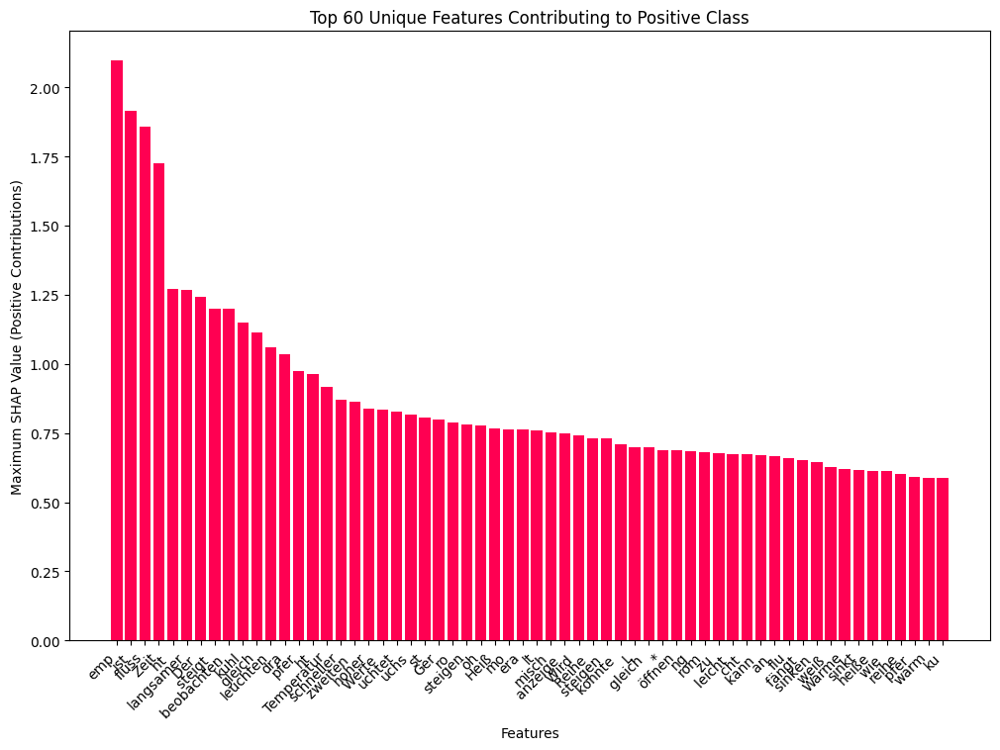

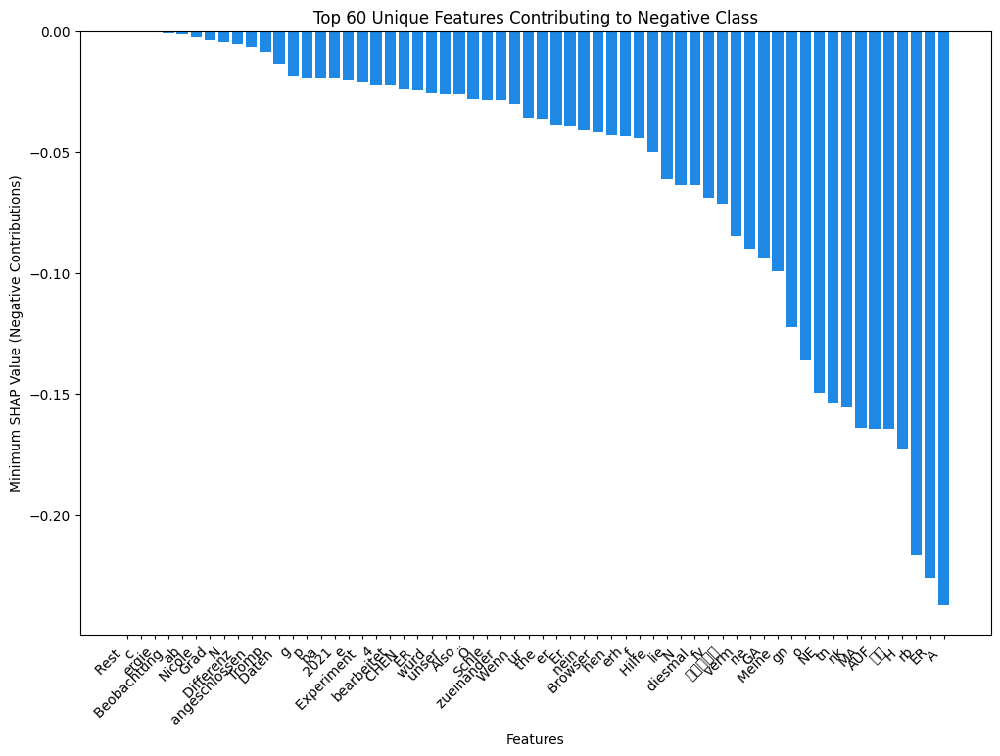

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming shap_values is already computed and contains values, base_values, and data
shap_values_array = shap_values.values
data_array = shap_values.data

# Extract the feature names for each instance
feature_names_list = [list(data) for data in data_array]

# Flatten SHAP values and feature names
flattened_shap_values = []
flattened_feature_names = []

for shap_vals, feat_names in zip(shap_values_array, feature_names_list):
    flattened_shap_values.extend(shap_vals)
    flattened_feature_names.extend(feat_names)

# Create a dictionary to store the maximum and minimum SHAP value for each unique feature
positive_feature_shap_dict = {}
negative_feature_shap_dict = {}
seen_features = set()

for feature, shap_value in zip(flattened_feature_names, flattened_shap_values):
    if feature and feature != ".":  # Skip the "." and blank features
        if feature in seen_features:
            continue  # Skip if the feature has already been processed
        seen_features.add(feature)
        if shap_value > 0:
            if feature in positive_feature_shap_dict:
                positive_feature_shap_dict[feature] = max(positive_feature_shap_dict[feature], shap_value)
            else:
                positive_feature_shap_dict[feature] = shap_value
        elif shap_value < 0:
            if feature in negative_feature_shap_dict:
                negative_feature_shap_dict[feature] = min(negative_feature_shap_dict[feature], shap_value)
            else:
                negative_feature_shap_dict[feature] = shap_value

# Sort features by their maximum positive SHAP values in descending order
sorted_positive_features = sorted(positive_feature_shap_dict.items(), key=lambda x: x[1], reverse=True)
# Sort features by their minimum negative SHAP values in ascending order (more negative values)
sorted_negative_features = sorted(negative_feature_shap_dict.items(), key=lambda x: x[1],reverse=True)

# Extract the top 60 unique features contributing to the positive class
top_60_positive_features = sorted_positive_features[:60]
top_60_positive_feature_names = [feature for feature, value in top_60_positive_features]
top_60_positive_shap_values = [value for feature, value in top_60_positive_features]

# Extract the top 60 unique features contributing to the negative class
top_60_negative_features = sorted_negative_features[:60]
top_60_negative_feature_names = [feature for feature, value in top_60_negative_features]
top_60_negative_shap_values = [value for feature, value in top_60_negative_features]

# Plot top 60 unique features contributing to the positive class with x-axis labels rotated
color_red = '#ff0052'
plt.figure(figsize=(12, 8))
plt.bar(top_60_positive_feature_names, top_60_positive_shap_values, color=color_red)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Maximum SHAP Value (Positive Contributions)')
plt.xlabel('Features')
plt.title('Top 60 Unique Features Contributing to Positive Class')
plt.show()

# Plot top 60 unique features contributing to the negative class with x-axis labels rotated
color_blue = '#1e88e5'
plt.figure(figsize=(12, 8))
plt.bar(top_60_negative_feature_names, top_60_negative_shap_values, color=color_blue)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Minimum SHAP Value (Negative Contributions)')
plt.xlabel('Features')
plt.title('Top 60 Unique Features Contributing to Negative Class')
plt.show()


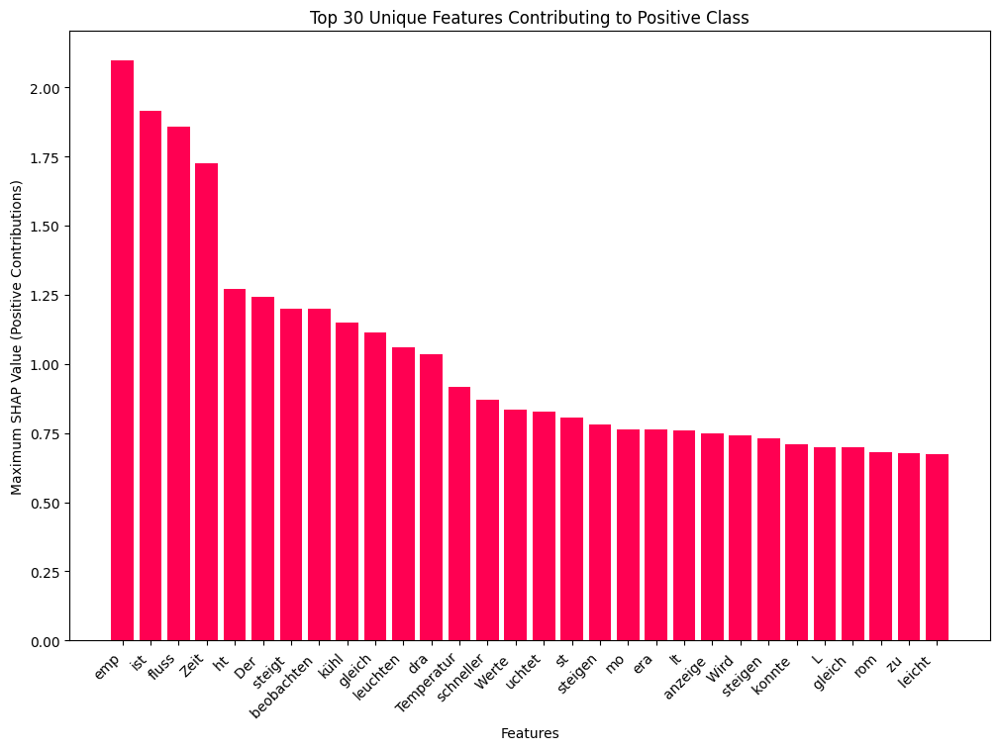

/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127383 (\N{SQUARED OK}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127378 (\N{SQUARED COOL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


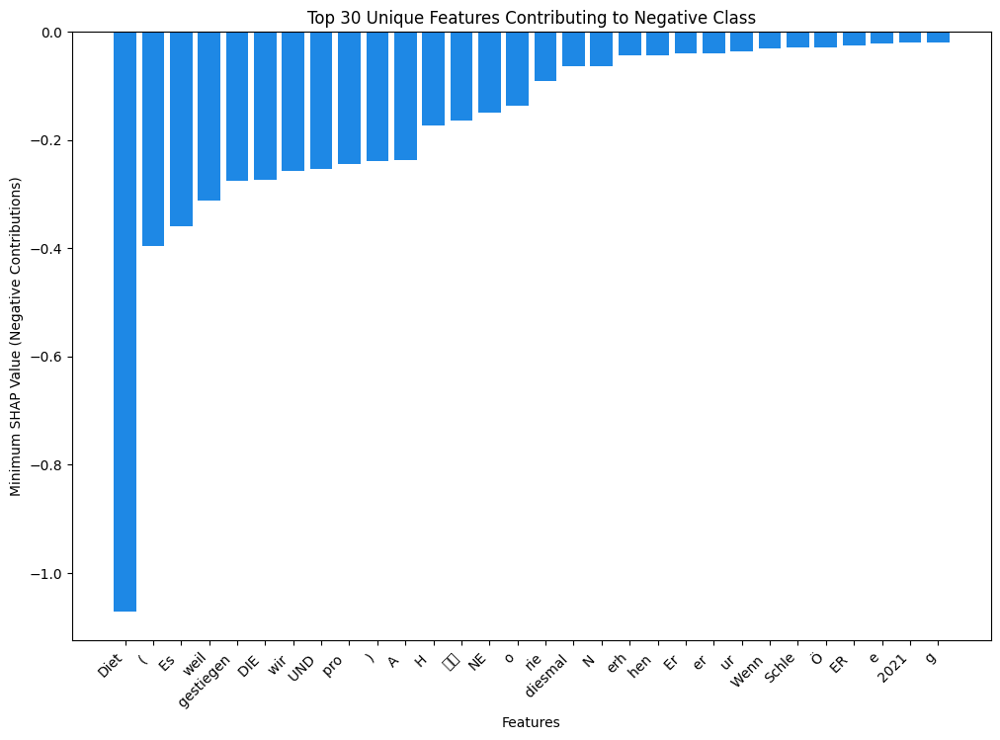

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming shap_values is already computed and contains values, base_values, and data
shap_values_array = shap_values.values
data_array = shap_values.data

# Extract the feature names for each instance
feature_names_list = [list(data) for data in data_array]

# Flatten SHAP values and feature names
flattened_shap_values = []
flattened_feature_names = []

for shap_vals, feat_names in zip(shap_values_array, feature_names_list):
    flattened_shap_values.extend(shap_vals)
    flattened_feature_names.extend(feat_names)

# Create a dictionary to store the maximum and minimum SHAP value for each unique feature
positive_feature_shap_dict = {}
negative_feature_shap_dict = {}
seen_features = set()

for feature, shap_value in zip(flattened_feature_names, flattened_shap_values):
    if feature and feature != ".":  # Skip the "." and blank features
        if feature in seen_features:
            continue  # Skip if the feature has already been processed
        seen_features.add(feature)
        if shap_value > 0:
            if feature in positive_feature_shap_dict:
                positive_feature_shap_dict[feature] = max(positive_feature_shap_dict[feature], shap_value)
            else:
                positive_feature_shap_dict[feature] = shap_value
        elif shap_value < 0:
            if feature in negative_feature_shap_dict:
                negative_feature_shap_dict[feature] = min(negative_feature_shap_dict[feature], shap_value)
            else:
                negative_feature_shap_dict[feature] = shap_value

# Sort features by their maximum positive SHAP values in descending order
sorted_positive_features = sorted(positive_feature_shap_dict.items(), key=lambda x: x[1], reverse=True)
# Sort features by their minimum negative SHAP values in ascending order (more negative values)
sorted_negative_features = sorted(negative_feature_shap_dict.items(), key=lambda x: x[1])

# Extract the top 30 unique features contributing to the positive class
top_30_positive_features = sorted_positive_features[:30]
top_30_positive_feature_names = [feature for feature, value in top_30_positive_features]
top_30_positive_shap_values = [value for feature, value in top_30_positive_features]

# Extract the top 30 unique features contributing to the negative class
top_30_negative_features = sorted_negative_features[:30]
top_30_negative_feature_names = [feature for feature, value in top_30_negative_features]
top_30_negative_shap_values = [value for feature, value in top_30_negative_features]

#colors = ['#ff0052'] * len(top_30_positive_feature_names) + ['#1e88e5'] * len(top_30_negative_feature_names)  # SHAP red and blue colors
color_red = '#ff0052'
color_blue = '#1e88e5'
# Plot top 30 unique features contributing to the positive class with x-axis labels rotated
plt.figure(figsize=(12, 8))
plt.bar(top_30_positive_feature_names, top_30_positive_shap_values, color = color_red)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Maximum SHAP Value (Positive Contributions)')
plt.xlabel('Features')
plt.title('Top 30 Unique Features Contributing to Positive Class')
plt.show()

# Plot top 30 unique features contributing to the negative class with x-axis labels rotated
plt.figure(figsize=(12, 8))
plt.bar(top_30_negative_feature_names, top_30_negative_shap_values, color = color_blue)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Minimum SHAP Value (Negative Contributions)')
plt.xlabel('Features')
plt.title('Top 30 Unique Features Contributing to Negative Class')
plt.show()

##Local Explanations

Negative instances

## Actually Negative but shown as positive

In [ ]:
shap.plots.text(shap_values[78])

In [ ]:
shap.plots.text(shap_values[9])

In [ ]:
shap.plots.text(shap_values[2])

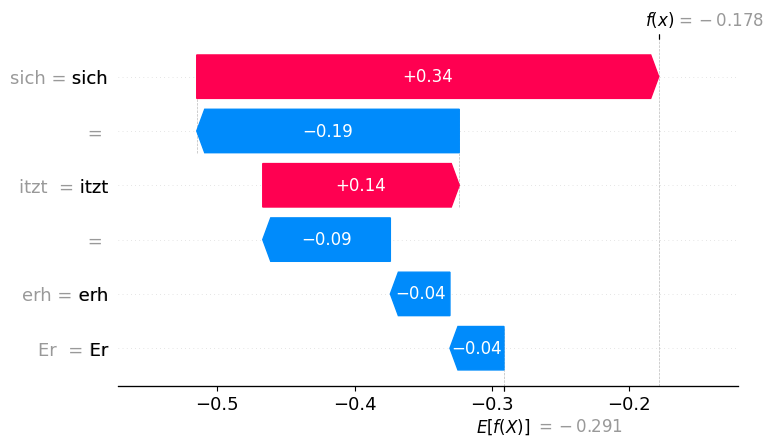

In [ ]:
shap.plots.waterfall(shap_values[2])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[2].base_values, shap_values[2].values, shap_values[2].data)

In [ ]:
shap.plots.text(shap_values[7])

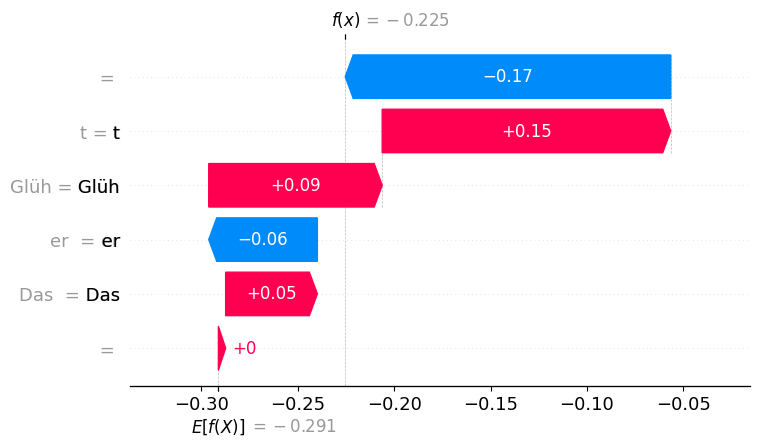

In [ ]:
shap.plots.waterfall(shap_values[7])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[7].base_values, shap_values[7].values, shap_values[7].data)

In [ ]:
shap.plots.text(shap_values[52])

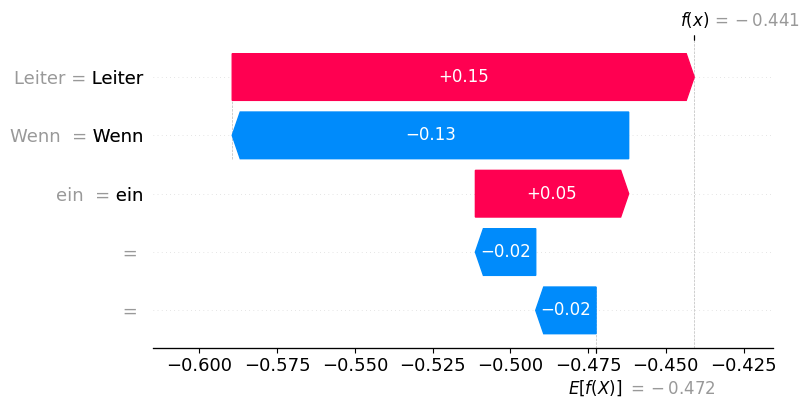

In [ ]:
shap.plots.waterfall(shap_values[52])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[52].base_values, shap_values[52].values, shap_values[52].data)

False Positive

In [ ]:
shap.plots.text(shap_values[0])

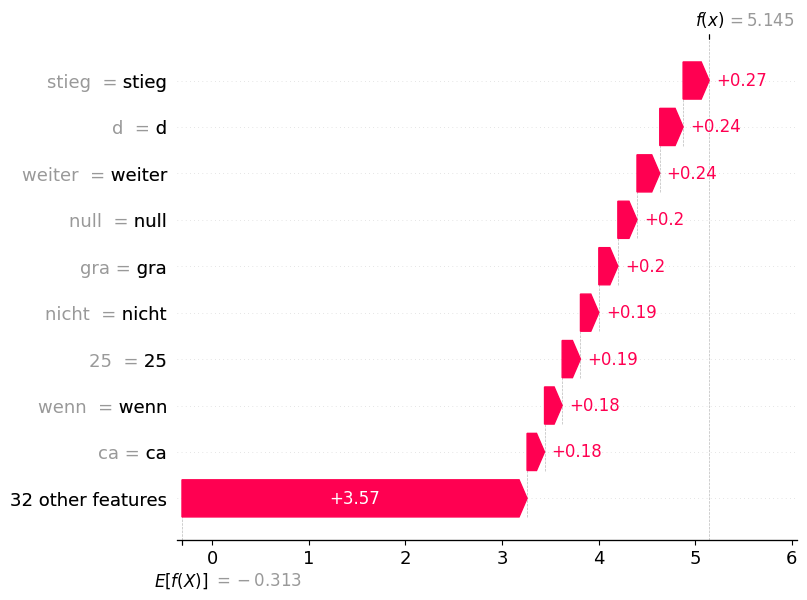

In [ ]:
shap.plots.waterfall(shap_values[0])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[0].base_values, shap_values[0].values, shap_values[0].data)


##positive instances

##Bigger text higher value

In [ ]:
shap.plots.text(shap_values[99])

In [ ]:
shap.plots.text(shap_values[99])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[99].base_values, shap_values[99].values, shap_values[99].data)

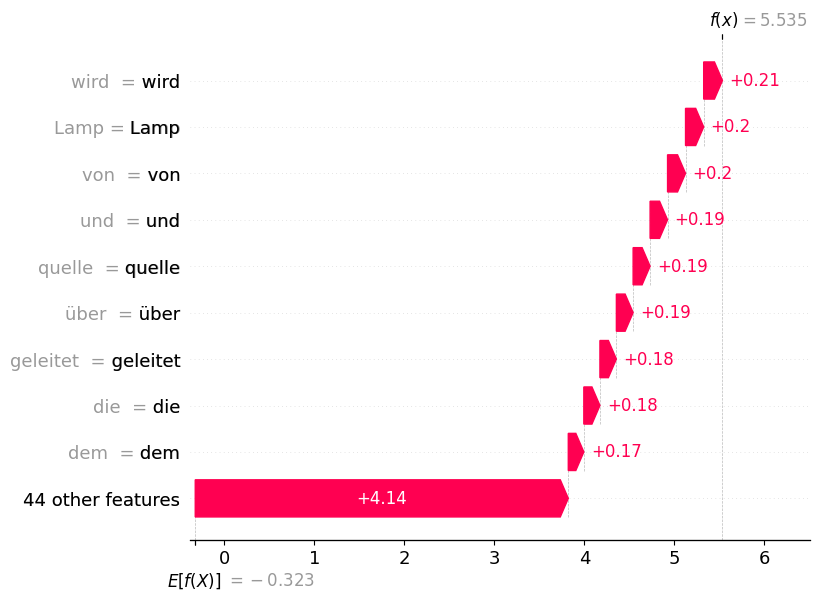

In [ ]:
shap.plots.waterfall(shap_values[99])

In [ ]:
shap.plots.text(shap_values[96])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[96].base_values, shap_values[96].values, shap_values[96].data)

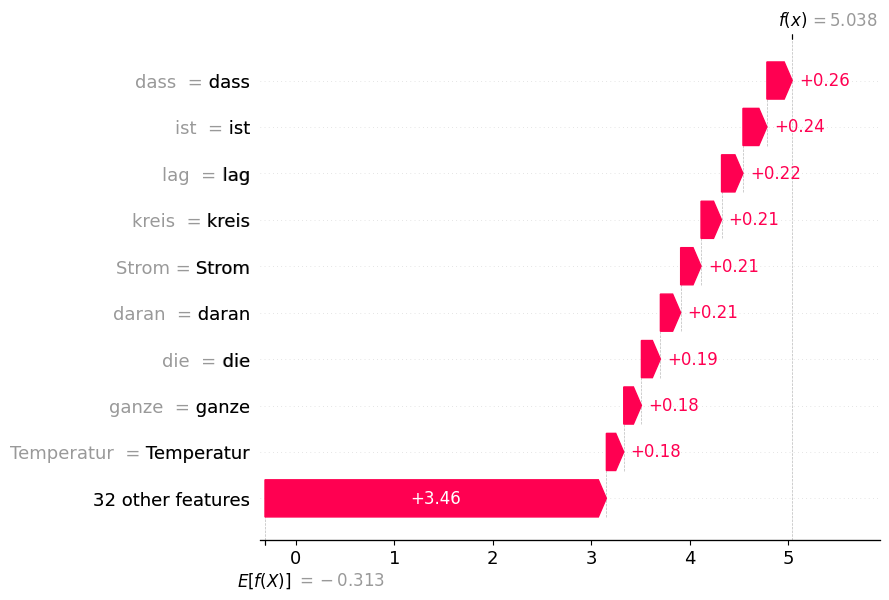

In [ ]:
shap.plots.waterfall(shap_values[96])

In [ ]:
shap.plots.text(shap_values[34])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[34].base_values, shap_values[34].values, shap_values[34].data)

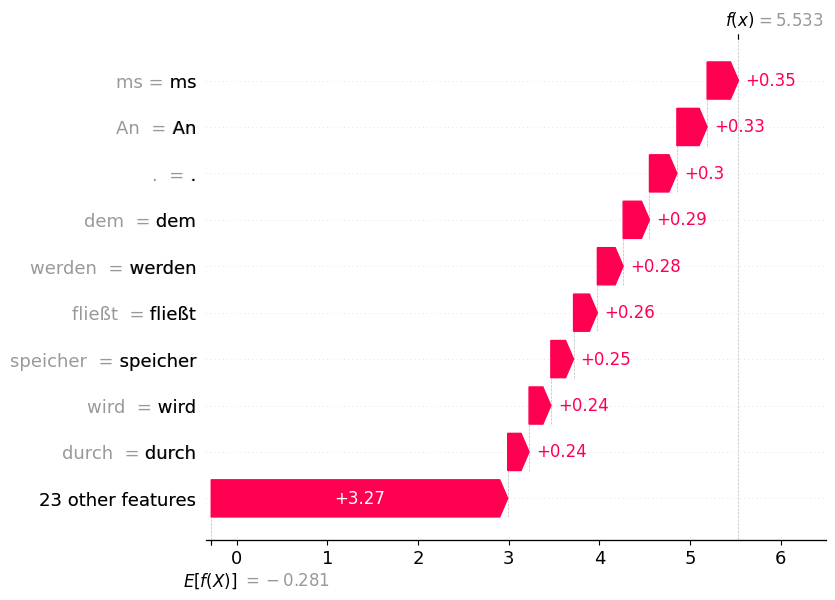

In [ ]:
shap.plots.waterfall(shap_values[34])

In [ ]:
shap.plots.text(shap_values[37])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[37].base_values, shap_values[37].values, shap_values[37].data)

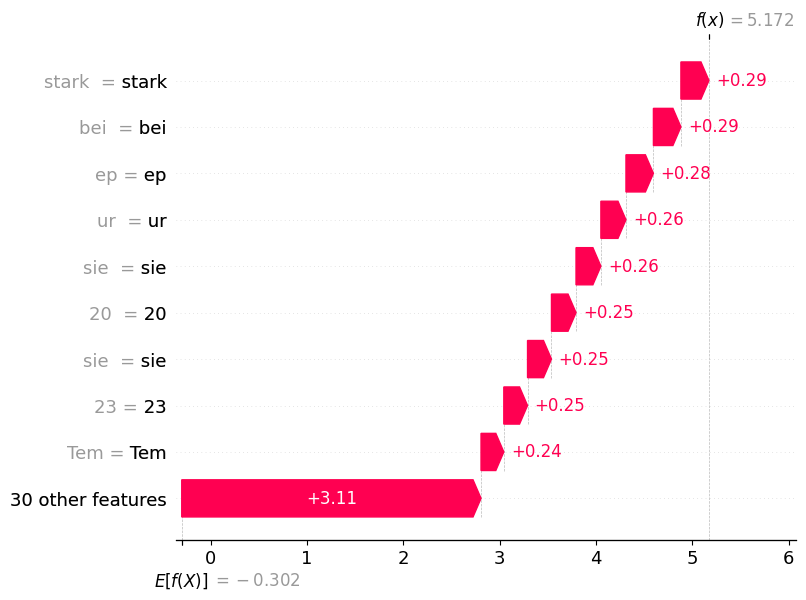

In [ ]:
shap.plots.waterfall(shap_values[37])

##Medium text

In [ ]:
shap.plots.text(shap_values[18])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[18].base_values, shap_values[18].values, shap_values[18].data)

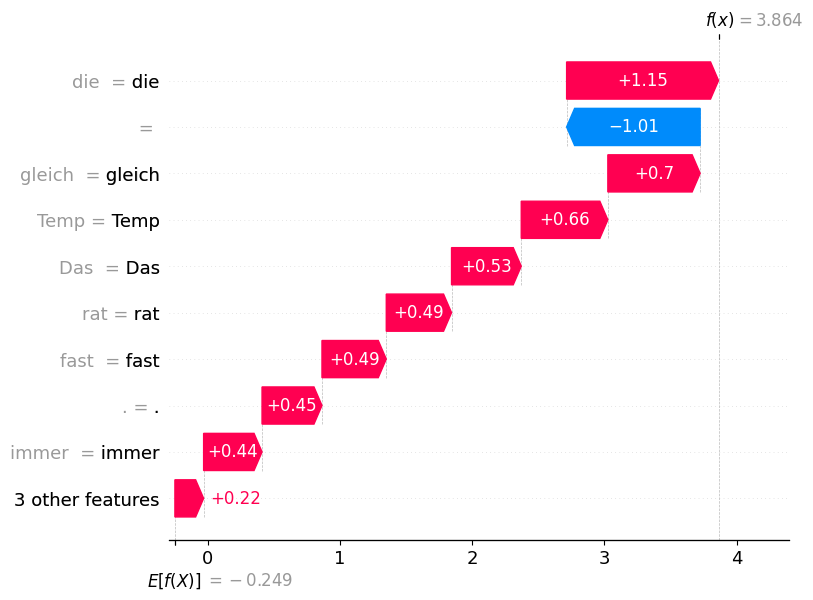

In [ ]:
shap.plots.waterfall(shap_values[18])

In [ ]:
shap.plots.text(shap_values[15])

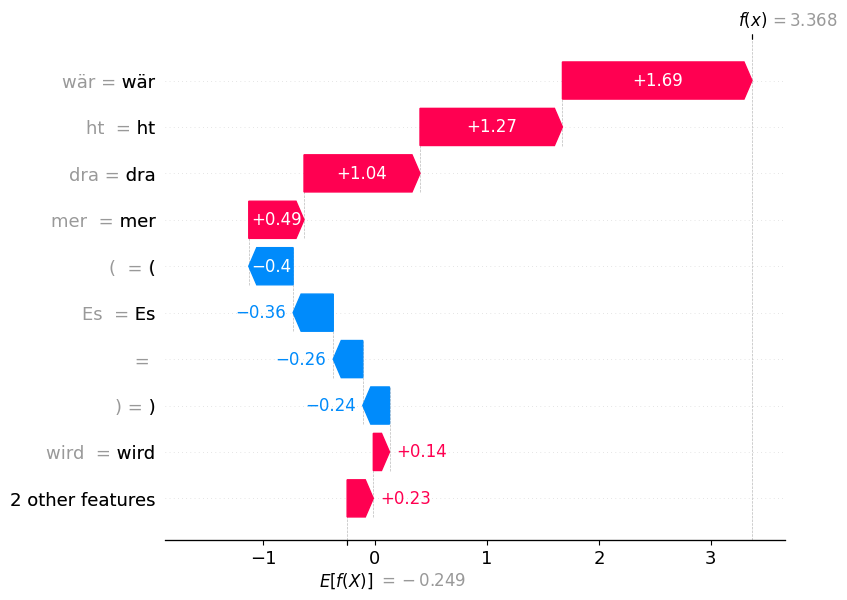

In [ ]:
shap.plots.waterfall(shap_values[15])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[15].base_values, shap_values[15].values, shap_values[15].data)

In [ ]:
shap.plots.text(shap_values[11])

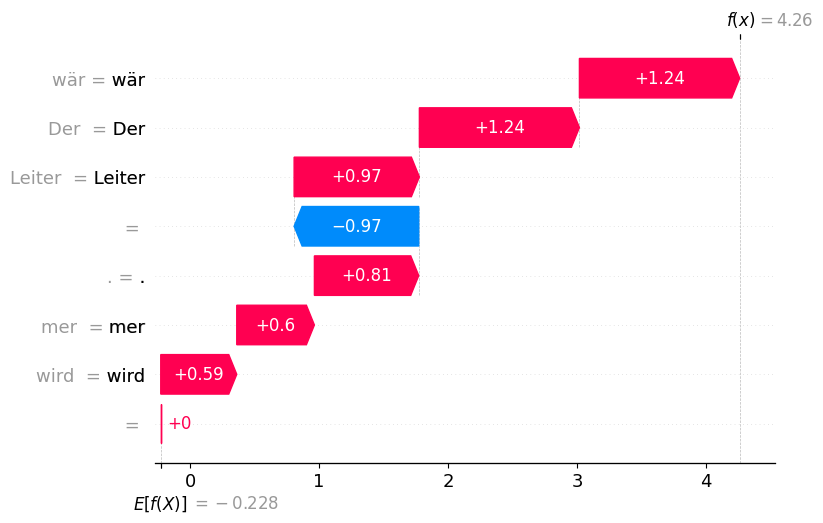

In [ ]:
shap.plots.waterfall(shap_values[11])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[11].base_values, shap_values[11].values, shap_values[11].data)


Occlusion study

preproccesing to generate masked input

In [ ]:
import json
import pandas as pd

# Load the data from the uploaded file
with open('/content/assembled.json', 'r') as file:
    data = json.load(file)

records = []

# Iterate through the data
for question_id, question_data in data.items():
    for student_id, student_data in question_data['answers'].items():
        # Check if 'labels' and 'Analyzing data' keys exist
        if 'labels' in student_data and 'Analyzing data' in student_data['labels']:
            label = 1 if student_data['labels']['Analyzing data'].get('score') == 'present' else 0
            tokens_list = student_data.get('tokens', [])
            evidences_list = student_data['labels']['Analyzing data'].get('evidences', [])

            combined_sentence = []
            # Process each list in tokens
            for sentence_tokens, sentence_evidences in zip(tokens_list, evidences_list):
                if label == 1:
                    # Mask tokens where evidence score is 1
                    masked_sentence = [
                        '[MASK]' if ev == 1 else tok for tok, ev in zip(sentence_tokens, sentence_evidences)
                    ]
                else:
                    # Keep sentence unchanged if evidence is absent
                    masked_sentence = sentence_tokens

                combined_sentence.extend(masked_sentence)

            final_sentence = " ".join(combined_sentence)
            records.append({
                'StudentID': student_id,
                'Masked Sentence': final_sentence,
                'label': label
            })

# Create a DataFrame
df_records = pd.DataFrame(records)

# Save the DataFrame to an Excel file
excel_file_path = 'processed_data_analyzing_data.xlsx'
df_records.to_excel(excel_file_path, index=False)

# Provide the file paths for user access
print(f"Excel file saved at: {excel_file_path}")


Excel file saved at: processed_data_analyzing_data.xlsx


In [ ]:
import pandas as pd
df1 = pd.read_excel("/content/AD_Pre_processed_data.xlsx")
df1.head(20)

,StudentID,Masked Sentence,Label
0,1420,Der Laptop verhielt sich anfangs recht gut lei...,0
1,1420,"Aber trotzdem kann man sagen , dass der Laptop...",0
2,1422,Auf dem [MASK] wurde eine online - Game gespie...,1
3,1422,Nach etwa 10 Sekunden erschien eine Notifikati...,1
4,1422,Nach ungefähr ! 0 Sekunden ist dann der Bildsc...,1
5,1424,Zuerst wird ein Videospiel gespielt und dann k...,1
6,1424,Anschließend schaltet sich der LAptop automati...,1
7,1426,"Es wurde [MASK] Computerspiel gespielt , bei d...",1
8,1426,Dann [MASK] [MASK] [MASK] [MASK] [MASK] [MASK]...,1
9,1428,[MASK] [MASK] [MASK] [MASK] und ging nach eine...,1


In [ ]:
df1['Label'].replace('-', '2', inplace=True)
df1 = df1[~df1['Label'].isnull()]
#df = df[df['Analyzing_Data'].str.isnumeric()]

In [ ]:
def to_skill(label):
    skill = int(label)
    if skill == 1:
        return 1
    elif skill == 0:
        return 0

df1['Label'] = df1.Label.apply(to_skill)
df1 = df1.dropna()


In [ ]:
df1.rename(columns={'Masked Sentence': 'text','Label': 'label'}, inplace=True)
df1.head(5)

,StudentID,text,label
0,1420,Der Laptop verhielt sich anfangs recht gut lei...,0
1,1420,"Aber trotzdem kann man sagen , dass der Laptop...",0
2,1422,Auf dem [MASK] wurde eine online - Game gespie...,1
3,1422,Nach etwa 10 Sekunden erschien eine Notifikati...,1
4,1422,Nach ungefähr ! 0 Sekunden ist dann der Bildsc...,1


In [ ]:
import datasets
from datasets import Dataset

In [ ]:
df1_train = df1.iloc[:474] # splitting the dataframe rowwise with first 50% of the data
df1_train_pd_whole = df1_train.iloc[:,1:3]# splitting the training data columnwise and taking only text and label columns
df1_train_pd_whole.head(5)

,text,label
0,Der Laptop verhielt sich anfangs recht gut lei...,0
1,"Aber trotzdem kann man sagen , dass der Laptop...",0
2,Auf dem [MASK] wurde eine online - Game gespie...,1
3,Nach etwa 10 Sekunden erschien eine Notifikati...,1
4,Nach ungefähr ! 0 Sekunden ist dann der Bildsc...,1


In [ ]:
train1_dataset = Dataset.from_dict(df1_train_pd_whole)

In [ ]:
df1_val = df1.iloc[475:711] #spliting data row-wise 25% of the data for validation set
df1_val_pd_whole = df1_val.iloc[:,1:3]# spliting the valdation dataset columnwise only to take text and the label
validation1_dataset = Dataset.from_dict(df1_val_pd_whole) # converting the dataframe into datasets.arrow_dataset.Dataset

In [ ]:
df1_test = df1.iloc[711:] #spliting data row-wise 25% of the data for test set
df1_test_pd_whole = df1_test.iloc[:,1:3]# spliting the test dataset columnwise only to take text and the label
test1_dataset = Dataset.from_dict(df1_test_pd_whole) # converting the dataframe into datasets.arrow_dataset.Dataset

In [ ]:
#converting datasets.arrow_dataset.Dataset into datasets.dataset_dict.DatasetDict'
final_dataset_dict1 = datasets.DatasetDict({"train":train1_dataset,"test":test1_dataset, "validation":validation1_dataset})
final_dataset_dict1

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 474
    })
    test: Dataset({
        features: ['text', 'label'],
        num_rows: 5910
    })
    validation: Dataset({
        features: ['text', 'label'],
        num_rows: 236
    })
})

In [ ]:
train1_final_dataset_dict = final_dataset_dict1["train"]

In [ ]:
!pip install shap

In [ ]:
import datasets
import numpy as np
import scipy as sp
import torch
import transformers
from datasets import Dataset
import shap

In [ ]:
model_AD_IB_GBERTBase = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-base", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
model_AD_IB_GBERTBase.load_state_dict(torch.load('/content/gdrive/MyDrive/Thesis/Model/FT_AD_IB_GBERTBase.pth'))

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(
Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


<All keys matched successfully>

In [ ]:
tokenizer = AutoTokenizer.from_pretrained('deepset/gbert-base', truncation=True, padding=True, max_length=512)

In [ ]:
def f(x):
    encodings = [tokenizer.encode_plus(v, padding="max_length", max_length=512, truncation=True, return_tensors="pt") for v in x]
    input_ids = torch.cat([e['input_ids'] for e in encodings], dim=0).cuda()
    attention_mask = torch.cat([e['attention_mask'] for e in encodings], dim=0).cuda()

    tv = torch.tensor(input_ids).cuda()
    outputs = model_AD_IB_GBERTBase(tv, attention_mask=attention_mask)[0].detach().cpu().numpy()
    scores = (np.exp(outputs).T / np.exp(outputs).sum(-1)).T
    val = sp.special.logit(scores[:, 1])  # use one vs rest logit units
    return val


In [ ]:
# build an explainer using a token masker
explainer_Occlusion = shap.Explainer(f, tokenizer)

In [ ]:
train1_final_dataset_dict[:50]

{'text': ['Der Laptop verhielt sich anfangs recht gut leider sagt der er uns nicht , ob der heiß gelaufen ist und ob das Programm überhaupt lief .',
  'Aber trotzdem kann man sagen , dass der Laptop ein Signal geschickt das er es nicht mehr halten kann und schließte das Programm automatisch .',
  'Auf dem [MASK] wurde eine online - Game gespielt .',
  'Nach etwa 10 Sekunden erschien eine Notifikation , welche den Spieler darauf aufmerksam machte , [MASK] [MASK] [MASK] [MASK] [MASK] und in 60 Sekunden ausgehen würde .',
  'Nach ungefähr ! 0 Sekunden ist dann der Bildschirm dunkel geworden/ aus gegangen .',
  'Zuerst wird ein Videospiel gespielt und dann kommt die [MASK] , [MASK] [MASK] [MASK] [MASK] [MASK] [MASK]',
  'Anschließend schaltet sich der LAptop automatisch aus [MASK]',
  'Es wurde [MASK] Computerspiel gespielt , bei dem man Städte bauen musste .',
  'Dann [MASK] [MASK] [MASK] [MASK] [MASK] [MASK] [MASK] , [MASK] [MASK] , [MASK] [MASK] [MASK] [MASK] [MASK] , weil zu lange gesp

In [ ]:
shap_values = explainer_Occlusion(train1_final_dataset_dict[:400], fixed_context=1, batch_size=2)

<ipython-input-24-3456267026cb>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tv = torch.tensor(input_ids).cuda()
<ipython-input-24-3456267026cb>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tv = torch.tensor(input_ids).cuda()
<ipython-input-24-3456267026cb>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tv = torch.tensor(input_ids).cuda()
<ipython-input-24-3456267026cb>:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), ra

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 293it [06:34,  2.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 322it [07:19,  1.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 357it [08:09,  1.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 401it [09:13,  1.39s/it]


##Global occlusion

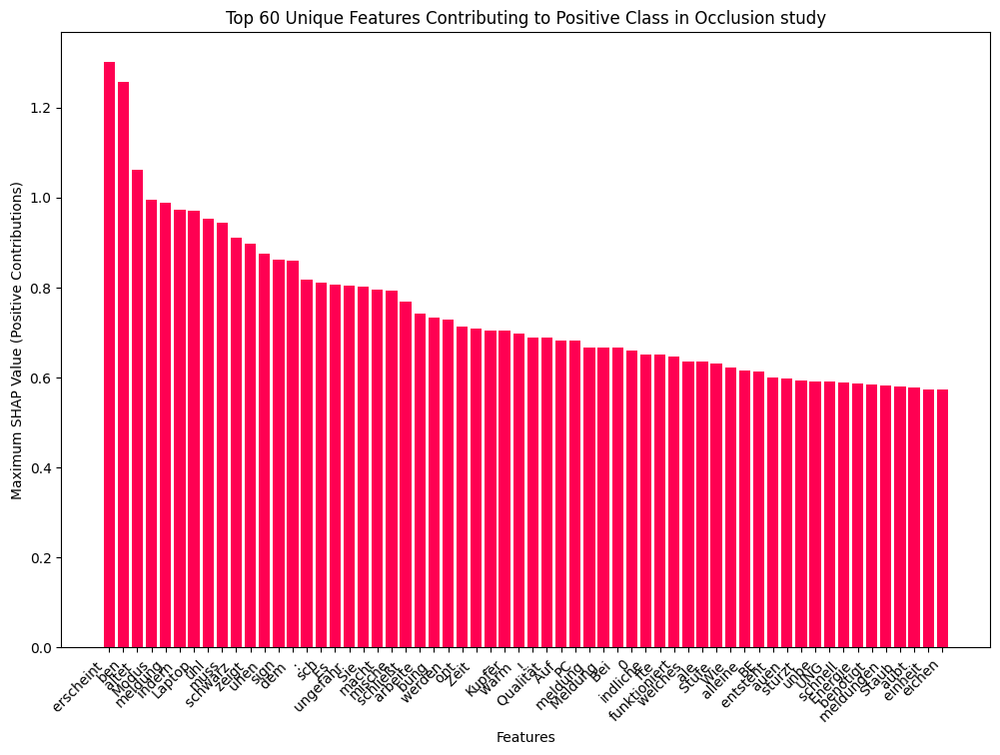

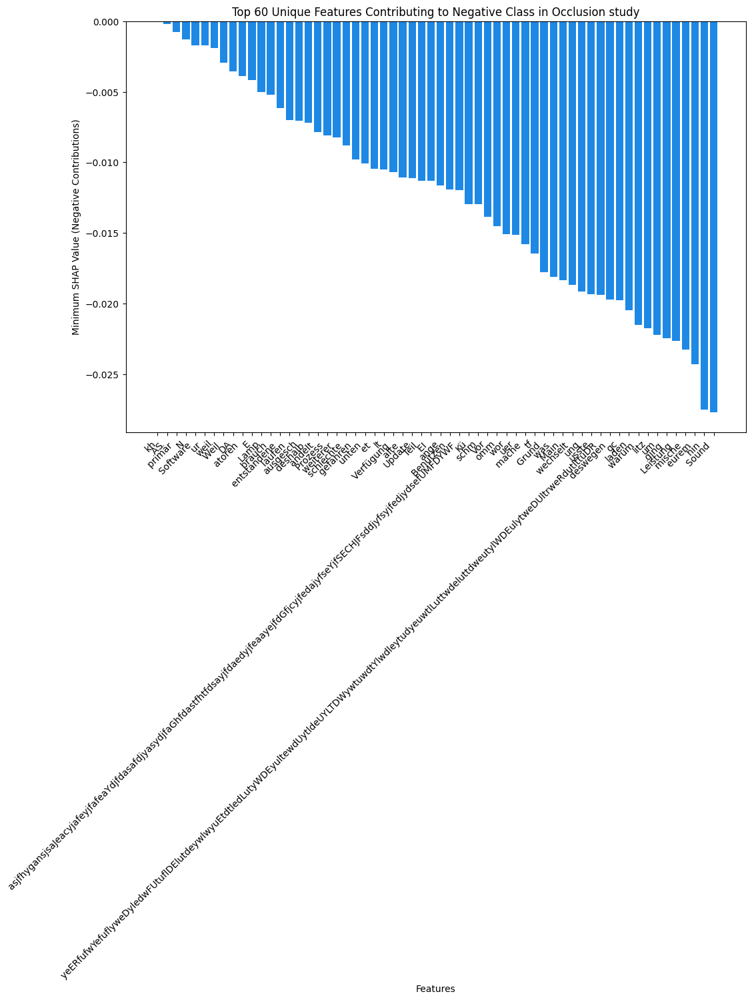

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming shap_values is already computed and contains values, base_values, and data
shap_values_array = shap_values.values
data_array = shap_values.data

# Extract the feature names for each instance
feature_names_list = [list(data) for data in data_array]

# Flatten SHAP values and feature names
flattened_shap_values = []
flattened_feature_names = []

for shap_vals, feat_names in zip(shap_values_array, feature_names_list):
    flattened_shap_values.extend(shap_vals)
    flattened_feature_names.extend(feat_names)

# Create a dictionary to store the maximum and minimum SHAP value for each unique feature
positive_feature_shap_dict = {}
negative_feature_shap_dict = {}
seen_features = set()

for feature, shap_value in zip(flattened_feature_names, flattened_shap_values):
    if feature and feature != ".":  # Skip the "." and blank features
        if feature in seen_features:
            continue  # Skip if the feature has already been processed
        seen_features.add(feature)
        if shap_value > 0:
            if feature in positive_feature_shap_dict:
                positive_feature_shap_dict[feature] = max(positive_feature_shap_dict[feature], shap_value)
            else:
                positive_feature_shap_dict[feature] = shap_value
        elif shap_value < 0:
            if feature in negative_feature_shap_dict:
                negative_feature_shap_dict[feature] = min(negative_feature_shap_dict[feature], shap_value)
            else:
                negative_feature_shap_dict[feature] = shap_value

# Sort features by their maximum positive SHAP values in descending order
sorted_positive_features = sorted(positive_feature_shap_dict.items(), key=lambda x: x[1], reverse=True)
# Sort features by their minimum negative SHAP values in ascending order (more negative values)
sorted_negative_features = sorted(negative_feature_shap_dict.items(), key=lambda x: x[1],reverse=True)

# Extract the top 60 unique features contributing to the positive class
top_60_positive_features = sorted_positive_features[:60]
top_60_positive_feature_names = [feature for feature, value in top_60_positive_features]
top_60_positive_shap_values = [value for feature, value in top_60_positive_features]

# Extract the top 60 unique features contributing to the negative class
top_60_negative_features = sorted_negative_features[:60]
top_60_negative_feature_names = [feature for feature, value in top_60_negative_features]
top_60_negative_shap_values = [value for feature, value in top_60_negative_features]

# Plot top 60 unique features contributing to the positive class with x-axis labels rotated
color_red = '#ff0052'
plt.figure(figsize=(12, 8))
plt.bar(top_60_positive_feature_names, top_60_positive_shap_values, color=color_red)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Maximum SHAP Value (Positive Contributions)')
plt.xlabel('Features')
plt.title('Top 60 Unique Features Contributing to Positive Class in Occlusion study')
plt.show()

# Plot top 60 unique features contributing to the negative class with x-axis labels rotated
color_blue = '#1e88e5'
plt.figure(figsize=(12, 8))
plt.bar(top_60_negative_feature_names, top_60_negative_shap_values, color=color_blue)
plt.xticks(rotation=45, ha='right')
plt.ylabel('Minimum SHAP Value (Negative Contributions)')
plt.xlabel('Features')
plt.title('Top 60 Unique Features Contributing to Negative Class in Occlusion study')
plt.show()

##Local Explanability


In [ ]:
shap.initjs()
shap.force_plot(shap_values[34].base_values, shap_values[34].values, shap_values[34].data)

In [ ]:
shap.plots.text(shap_values[34])

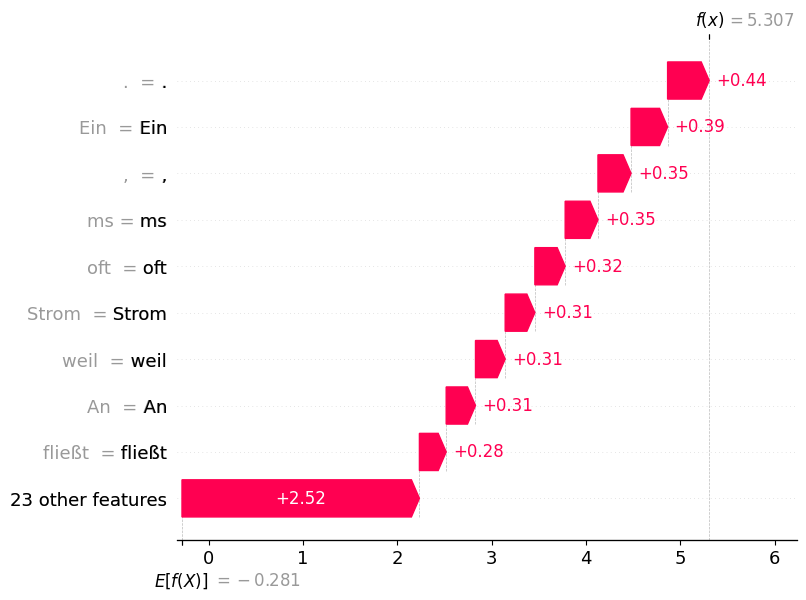

In [ ]:
shap.plots.waterfall(shap_values[34])

In [ ]:
shap.plots.text(shap_values[96])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[96].base_values, shap_values[96].values, shap_values[96].data)

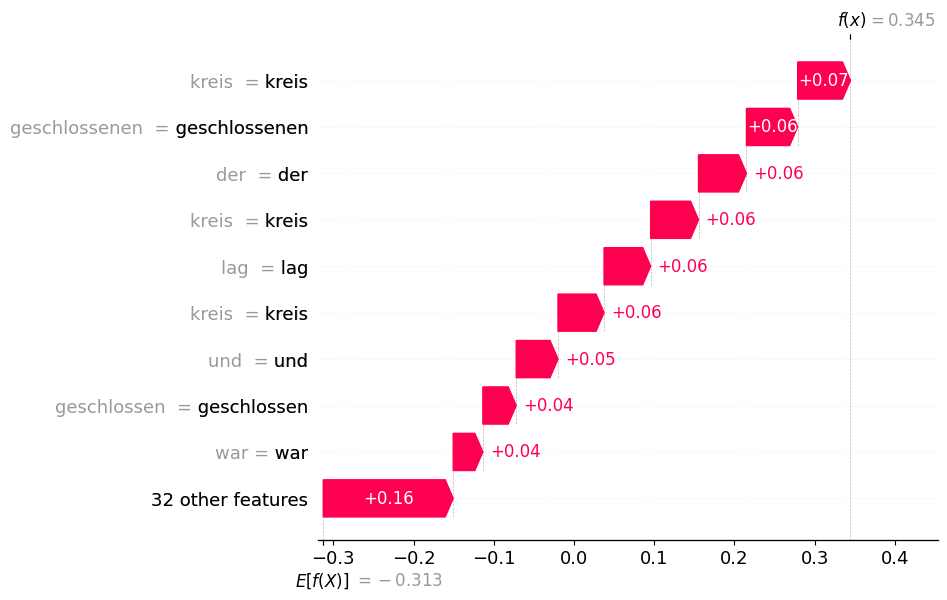

In [ ]:
shap.plots.waterfall(shap_values[96])

In [ ]:
shap.plots.text(shap_values[99])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[99].base_values, shap_values[99].values, shap_values[99].data)

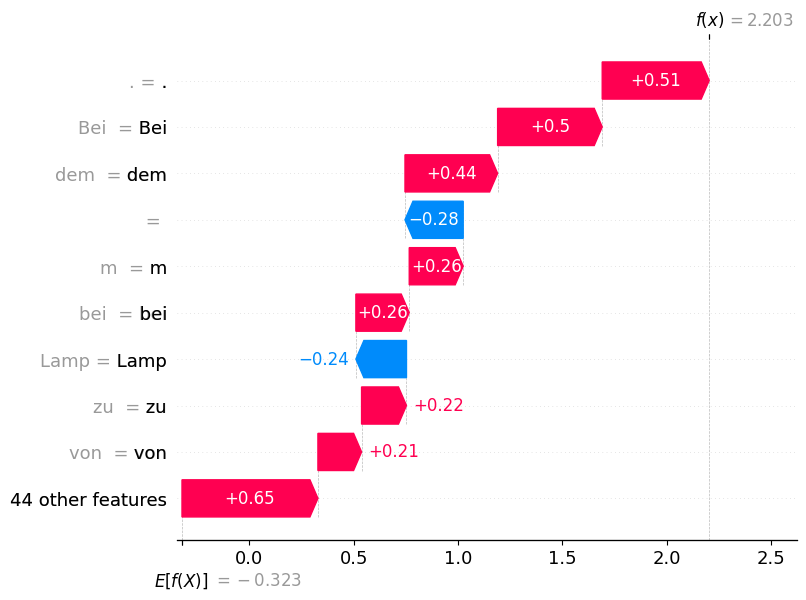

In [ ]:
shap.plots.waterfall(shap_values[99])

In [ ]:
shap.plots.text(shap_values[37])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[37].base_values, shap_values[37].values, shap_values[37].data)

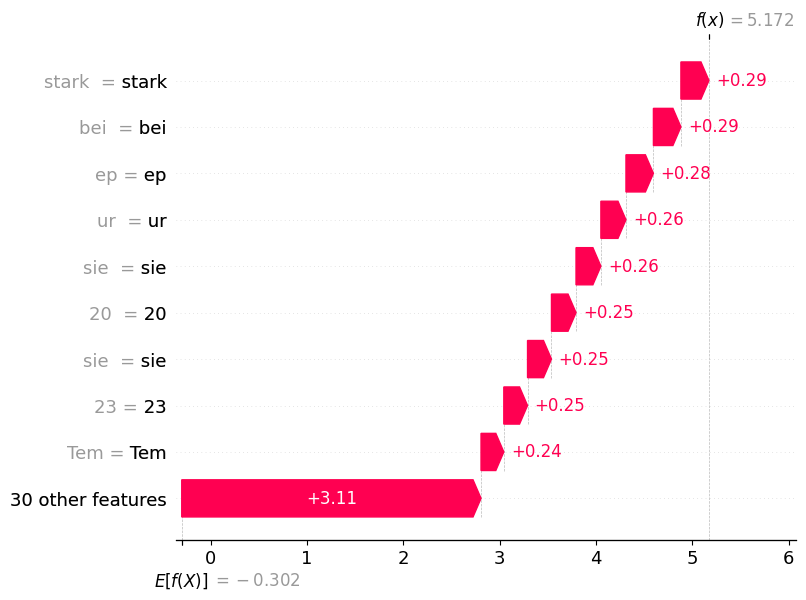

In [ ]:
shap.plots.waterfall(shap_values[37])

Change from true positive to false negative

In [ ]:
shap.initjs()
shap.force_plot(shap_values[15].base_values, shap_values[15].values, shap_values[15].data)

In [ ]:
shap.plots.text(shap_values[15])

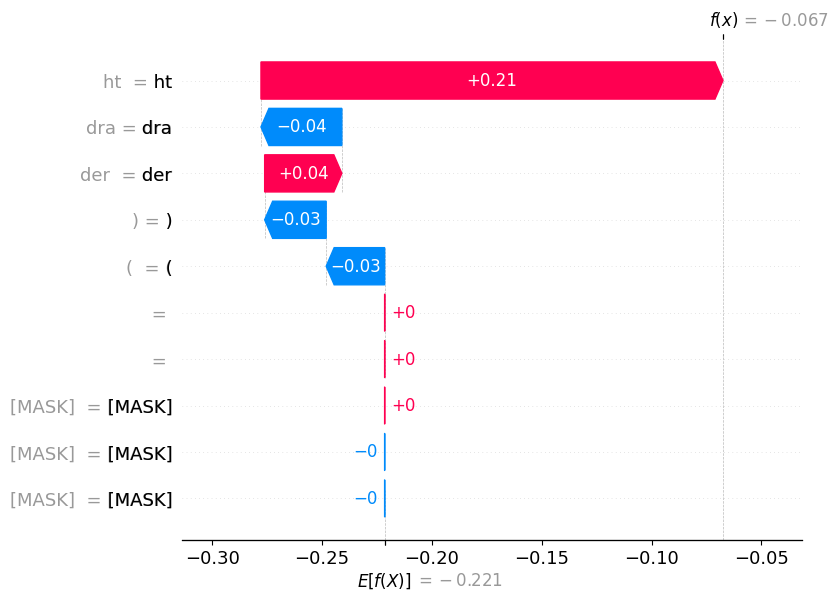

In [ ]:
shap.plots.waterfall(shap_values[15])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[11].base_values, shap_values[11].values, shap_values[11].data)

In [ ]:
shap.plots.text(shap_values[11])

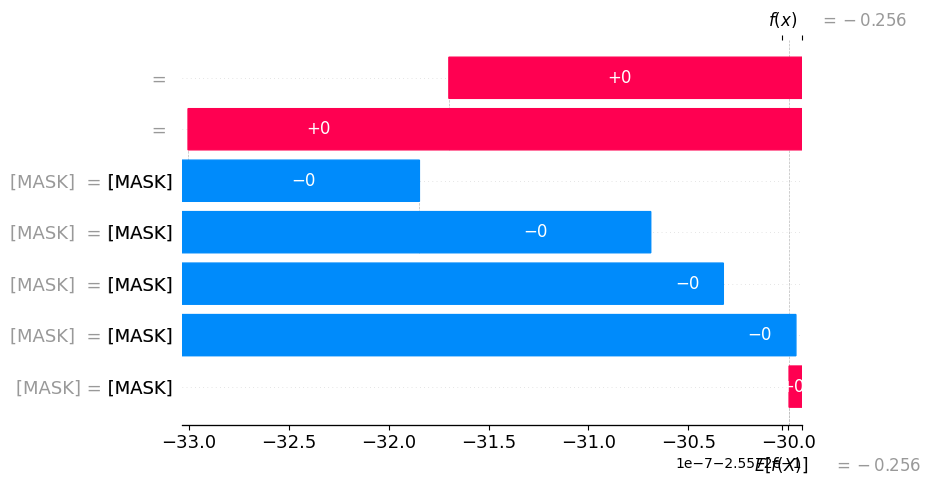

In [ ]:
shap.plots.waterfall(shap_values[11])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[15].base_values, shap_values[15].values, shap_values[15].data)

In [ ]:
shap.plots.text(shap_values[18])

In [ ]:
shap.initjs()
shap.force_plot(shap_values[18].base_values, shap_values[18].values, shap_values[18].data)

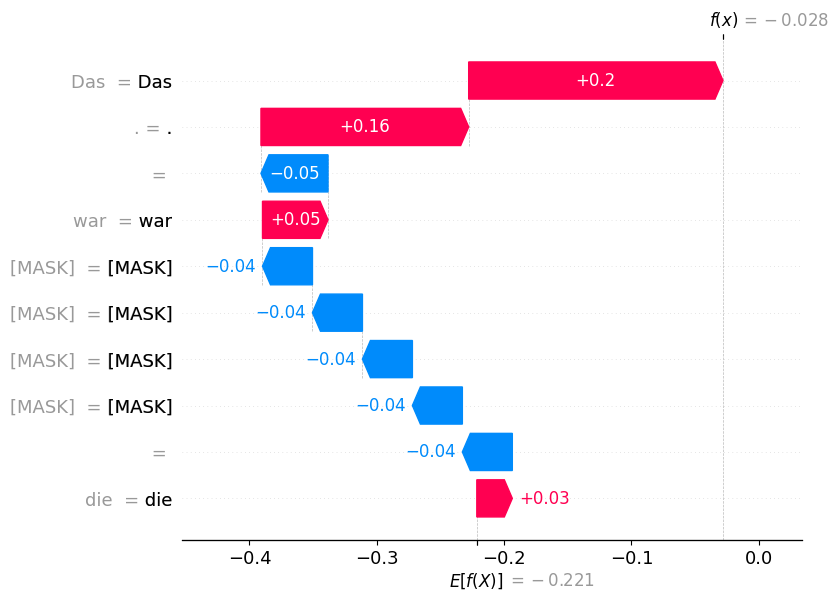

In [ ]:
shap.plots.waterfall(shap_values[18])

##predictive performance

In [ ]:
import pandas as pd
df2 = pd.read_excel("/content/18.06.13.44processed_data.xlsx")
df2.head(20)

,StudentID,Masked Sentence,Label
0,1420,Der Laptop verhielt sich anfangs recht gut lei...,0
1,1421,NaN,1
2,1422,Auf dem [MASK] wurde eine online - Game gespie...,1
3,1423,NaN,0
4,1424,Zuerst wird ein Videospiel gespielt und dann k...,1
5,1425,NaN,0
6,1426,"Es wurde [MASK] Computerspiel gespielt , bei d...",1
7,1427,NaN,1
8,1428,[MASK] [MASK] [MASK] [MASK] und ging nach eine...,1
9,1429,NaN,0


In [ ]:
df2.head(5)

,StudentID,Masked Sentence,Label
0,1420,Der Laptop verhielt sich anfangs recht gut lei...,0
1,1421,NaN,1
2,1422,Auf dem [MASK] wurde eine online - Game gespie...,1
3,1423,NaN,0
4,1424,Zuerst wird ein Videospiel gespielt und dann k...,1


In [ ]:
df2.rename(columns={'Label': 'label'}, inplace=True)

In [ ]:
df2['label'].replace('-', '2', inplace=True)
df2 = df2[~df2['label'].isnull()]
#df = df[df['Analyzing_Data'].str.isnumeric()]

In [ ]:
def to_skill(label):
    skill = int(label)
    if skill == 1:
        return 1
    elif skill == 0:
        return 0

df2['label'] = df2.label.apply(to_skill)
df2 = df2.dropna()


In [ ]:
df2.rename(columns={'Masked Sentence': 'text'}, inplace=True)
df2.head(5)

,StudentID,text,label
0,1420,Der Laptop verhielt sich anfangs recht gut lei...,0
2,1422,Auf dem [MASK] wurde eine online - Game gespie...,1
4,1424,Zuerst wird ein Videospiel gespielt und dann k...,1
6,1426,"Es wurde [MASK] Computerspiel gespielt , bei d...",1
8,1428,[MASK] [MASK] [MASK] [MASK] und ging nach eine...,1


In [ ]:
texts = list(df2['text'].values)
labels = list(df2['label'].values)
students = list(df2['StudentID'].values)


df3 = pd.DataFrame.from_dict({'texts': texts, 'labels': labels, 'students': students})

class TorchDataSet(torch.utils.data.Dataset):
    def __init__(self, encodings, labels):
        self.encodings = encodings
        self.labels = labels

    def __getitem__(self, idx):
        item = {k: v[idx].clone() for k, v in self.encodings.items()}
        item["labels"] = torch.tensor(self.labels[idx]).long()
        return item

    def __len__(self):
        return len(self.labels)

f1s_list = []  # Store individual F1 scores for each fold
accuracy_list = []
precision_list = []
recall_list = []
kappa_list = []

# Lists to store all predictions, ground truths, and other details
all_predictions = []
all_ground_truths = []
all_students = []
all_answers = []


for jk in range(1):
    kfold = KFold(n_splits=5, shuffle=True, random_state=42)
    l = 0
    for train_index, val_index in kfold.split(df1):
        print(f'{jk+1}x{l+1}')

        X_train = df3['texts'].values[train_index]
        X_test = df3['texts'].values[val_index]
        y_train = df3['labels'].values[train_index]
        y_test = df3['labels'].values[val_index]
        student_ids_test = df3['students'].values[val_index]
        answers_test = df3['texts'].values[val_index]

        tokenizer = AutoTokenizer.from_pretrained('deepset/gbert-base', truncation=True, padding=True, max_length=512)
        model = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-base", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
        collator = DataCollatorWithPadding(tokenizer=tokenizer, padding=True)

        train_inp = tokenizer(list(X_train), padding=True, truncation=True, return_tensors='pt')
        test_inp = tokenizer(list(X_test), padding=True, truncation=True, return_tensors='pt')
        train_dataset = TorchDataSet(train_inp, y_train)
        test_dataset = TorchDataSet(test_inp, y_test)

        def compute_metrics(eval_pred):
            labels = eval_pred.label_ids
            preds = np.argmax(eval_pred.predictions, axis=1)
            accuracy = accuracy_score(labels, preds)
            f1 = f1_score(labels, preds)
            precision = precision_score(labels, preds)
            recall = recall_score(labels, preds)
            kappa = cohen_kappa_score(labels, preds, weights='quadratic')
            return {
                "accuracy": accuracy,
                "f1": f1,
                "precision": precision,
                "recall": recall,
                "quadratic_kappa": kappa
            }

        training_args = TrainingArguments(
            output_dir="final_bert_trainer",
            evaluation_strategy="epoch",
            save_strategy='epoch',
            logging_strategy='epoch',
            learning_rate=1e-5,
            per_device_train_batch_size=2,
            per_device_eval_batch_size=2,
            num_train_epochs=3,
            weight_decay=0.01,
            load_best_model_at_end=True,
            save_total_limit=1,
            logging_dir='./logs',
            warmup_steps=400
        )

        trainer = Trainer(
            model=model,
            args=training_args,
            train_dataset=train_dataset,
            eval_dataset=test_dataset,
            tokenizer=tokenizer,
            data_collator=collator,
            compute_metrics=compute_metrics,
        )

        trainer.train()

        model_save_name = 'FT_AD_IB_GBERTBase_masked.pth'
        path = F"/content/gdrive/MyDrive/Thesis/Model/{model_save_name}"
        torch.save(model.state_dict(), path)

        model.eval()

        logits_list = []
        for batch in DataLoader(test_dataset, batch_size = 2):
            with torch.no_grad():
              input_ids = batch['input_ids'].to(torch.device('cuda'))
              attention_mask = batch['attention_mask'].to(torch.device('cuda'))
              labels = batch['labels'].to(torch.device('cuda'))

              outputs = model(input_ids=input_ids, attention_mask=attention_mask, labels=labels)
              logits = outputs.logits
              logits_list.append(logits.cpu().numpy())

        logits = np.concatenate(logits_list, axis=0)

        threshold = 0.5
        probabilities = torch.sigmoid(torch.tensor(logits))
        predictions = (probabilities >= threshold).int()
        pred = predictions.numpy()

        y_test_binary = (y_test >= 0.5).astype(int)
        pred_binary = np.argmax(pred, axis=1)

        # Save predictions, ground truth, and other details
        all_predictions.extend(pred_binary)
        all_ground_truths.extend(y_test_binary)
        all_students.extend(student_ids_test)
        all_answers.extend(answers_test)

        accuracy = accuracy_score(y_test_binary, pred_binary)
        precision = precision_score(y_test_binary, pred_binary)
        recall = recall_score(y_test_binary, pred_binary)
        f1 = f1_score(y_test_binary, pred_binary)
        kappa = cohen_kappa_score(y_test_binary, pred_binary, weights='quadratic')

        print(f"Accuracy: {accuracy}, Precision: {precision}, Recall: {recall}, F1 Score: {f1}, Quadratic Kappa: {kappa}")
        l += 1
        accuracy_list.append(accuracy)
        precision_list.append(precision)
        recall_list.append(recall)
        f1s_list.append(f1)
        kappa_list.append(kappa)

        # Release GPU memory
        torch.cuda.empty_cache()

# Calculate the mean metrics across all folds
mean_accuracy = np.mean(accuracy_list)
mean_precision = np.mean(precision_list)
mean_recall = np.mean(recall_list)
mean_f1s = np.mean(f1s_list)
mean_kappa = np.mean(kappa_list)

print(f"Mean Accuracy: {mean_accuracy}")
print(f"Mean Precision: {mean_precision}")
print(f"Mean Recall: {mean_recall}")
print(f"Mean F1 Score: {mean_f1s}")
print(f"Mean Quadratic Kappa: {mean_kappa}")

# Save predictions, ground truth, and other details to an Excel file
output_df = pd.DataFrame({
    'student_id': all_students,
    'Answer': all_answers,
    'Actual Label': all_ground_truths,
    'Predicted Label': all_predictions
})
output_df.to_excel('/content/gdrive/MyDrive/Thesis/Predictions/predictions_AD_IB_GBERTBase_masked.xlsx', index=False)

print("Predictions and ground truths have been saved to 'predictions_ground_truths.xlsx'.")

1x1


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.366200,0.151855,0.938462,0.956835,1.000000,0.917241,0.850384
2,0.236000,0.213594,0.943590,0.960573,1.000000,0.924138,0.862014
3,0.176800,0.202956,0.953846,0.967972,1.000000,0.937931,0.885705


Accuracy: 0.9384615384615385, Precision: 1.0, Recall: 0.9172413793103448, F1 Score: 0.9568345323741008, Quadratic Kappa: 0.850383631713555
1x2


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.390500,0.279433,0.923077,0.947735,1.000000,0.900662,0.803599
2,0.285300,0.261959,0.928205,0.953333,0.959732,0.947020,0.797808
3,0.210000,0.258717,0.938462,0.959732,0.972789,0.947020,0.829396


Accuracy: 0.9384615384615385, Precision: 0.9727891156462585, Recall: 0.9470198675496688, F1 Score: 0.959731543624161, Quadratic Kappa: 0.8293963254593176
1x3


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.352800,0.354324,0.922680,0.948454,1.000000,0.901961,0.795445
2,0.270300,0.351250,0.922680,0.948454,1.000000,0.901961,0.795445
3,0.229500,0.281088,0.927835,0.952055,1.000000,0.908497,0.807567


Accuracy: 0.9226804123711341, Precision: 1.0, Recall: 0.9019607843137255, F1 Score: 0.9484536082474228, Quadratic Kappa: 0.795444959932518
1x4


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.352500,0.216825,0.912371,0.944625,1.000000,0.895062,0.737796
2,0.331600,0.350397,0.912371,0.944625,1.000000,0.895062,0.737796
3,0.269100,0.333847,0.917526,0.948052,1.000000,0.901235,0.750643


Accuracy: 0.9072164948453608, Precision: 1.0, Recall: 0.8888888888888888, F1 Score: 0.9411764705882353, Quadratic Kappa: 0.7252124645892352
1x5


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1474: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(


Epoch,Training Loss,Validation Loss,Accuracy,F1,Precision,Recall,Quadratic Kappa
1,0.345100,0.275328,0.922680,0.950166,1.000000,0.905063,0.779646
2,0.254300,0.386042,0.917526,0.946667,1.000000,0.898734,0.767107
3,0.218300,0.328961,0.917526,0.946667,1.000000,0.898734,0.767107


Accuracy: 0.9175257731958762, Precision: 1.0, Recall: 0.8987341772151899, F1 Score: 0.9466666666666668, Quadratic Kappa: 0.7671068427370948
Mean Accuracy: 0.9248691514670895
Mean Precision: 0.9945578231292517
Mean Recall: 0.9107690194555635
Mean F1 Score: 0.9505725643001174
Mean Quadratic Kappa: 0.7935088448863441
Predictions and ground truths have been saved to 'predictions_ground_truths.xlsx'.


In [ ]:
model_AD_IB_GBERTBase = AutoModelForSequenceClassification.from_pretrained("deepset/gbert-base", num_labels=2, ignore_mismatched_sizes=True).to(torch.device('cuda'))
model_AD_IB_GBERTBase.load_state_dict(torch.load('/content/gdrive/MyDrive/Thesis/Model/FT_AD_IB_GBERTBase.pth'))

##Prediction for the Normal response

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
import pandas as pd

class TextDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            return_token_type_ids=False,
            padding='max_length',
            return_attention_mask=True,
            return_tensors='pt',
            truncation=True,
        )
        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)
        }

def create_data_loader(texts, labels, tokenizer, max_length, batch_size):
    ds = TextDataset(
        texts=texts,
        labels=labels,
        tokenizer=tokenizer,
        max_length=max_length
    )
    return DataLoader(ds, batch_size=batch_size, num_workers=4)

def load_model(model_path, model_name, device):
    model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True).to(device)
    model.load_state_dict(torch.load(model_path))
    tokenizer = AutoTokenizer.from_pretrained(model_name, truncation=True, padding=True, max_length=512)
    return tokenizer, model

def evaluate_model(model, data_loader, device):
    model.eval()
    predictions = []
    true_labels = []
    with torch.no_grad():
        for d in data_loader:
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            labels = d["label"].to(device)
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            _, preds = torch.max(outputs.logits, dim=1)
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    return predictions, true_labels

def compute_metrics(predictions, true_labels):
    accuracy = accuracy_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions, average='binary')
    recall = recall_score(true_labels, predictions, average='binary')
    f1 = f1_score(true_labels, predictions, average='binary')
    kappa = cohen_kappa_score(true_labels, predictions)
    return accuracy, precision, recall, f1, kappa

def main():
    # Load fine-tuned model and tokenizer
    model_path = '/content/gdrive/MyDrive/Thesis/Model/FT_AD_IB_GBERTBase.pth'
    model_name = 'deepset/gbert-base'
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    tokenizer, model = load_model(model_path, model_name, device)

    # Load masked data from a dataframe
    #df = pd.read_csv('path_to_masked_data.csv')  # replace with the path to your dataframe
    masked_texts = df2['text'].tolist()
    labels = df2['label'].tolist()
    student_ids = df2['StudentID'].tolist()  # Assuming your dataframe has a column named 'student_id'

    # Create DataLoader
    max_length = 128
    batch_size = 16
    data_loader = create_data_loader(masked_texts, labels, tokenizer, max_length, batch_size)

    # Evaluate model
    predictions, true_labels = evaluate_model(model, data_loader, device)

    # Compute metrics
    accuracy, precision, recall, f1, kappa = compute_metrics(predictions, true_labels)

    # Print results
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')
    print(f'Kappa Score: {kappa:.4f}')

    # Create output DataFrame
    output_df = pd.DataFrame({
        'student_id': student_ids,
        'answer': masked_texts,
        'actual': true_labels,
        'predicted': predictions
    })

    # Save to Excel
    output_df.to_excel('model_evaluation_AD_IB_GBERTbase_normal.xlsx', index=False)

if __name__ == "__main__":
    main()


##Prediction for Occluded response

In [ ]:
import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
import pandas as pd

class TextDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            return_token_type_ids=False,
            padding='max_length',
            return_attention_mask=True,
            return_tensors='pt',
            truncation=True,
        )
        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)
        }

def create_data_loader(texts, labels, tokenizer, max_length, batch_size):
    ds = TextDataset(
        texts=texts,
        labels=labels,
        tokenizer=tokenizer,
        max_length=max_length
    )
    return DataLoader(ds, batch_size=batch_size, num_workers=4)

def load_model(model_path, model_name, device):
    model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True).to(device)
    model.load_state_dict(torch.load(model_path))
    tokenizer = AutoTokenizer.from_pretrained(model_name, truncation=True, padding=True, max_length=512)
    return tokenizer, model

def evaluate_model(model, data_loader, device):
    model.eval()
    predictions = []
    true_labels = []
    with torch.no_grad():
        for d in data_loader:
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            labels = d["label"].to(device)
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            _, preds = torch.max(outputs.logits, dim=1)
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    return predictions, true_labels

def compute_metrics(predictions, true_labels):
    accuracy = accuracy_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions, average='binary')
    recall = recall_score(true_labels, predictions, average='binary')
    f1 = f1_score(true_labels, predictions, average='binary')
    kappa = cohen_kappa_score(true_labels, predictions)
    return accuracy, precision, recall, f1, kappa

def main():
    # Load fine-tuned model and tokenizer
    model_path = '/content/gdrive/MyDrive/Thesis/Model/FT_AD_IB_GBERTBase.pth'
    model_name = 'deepset/gbert-base'
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    tokenizer, model = load_model(model_path, model_name, device)

    # Load masked data from a dataframe
    #df = pd.read_csv('path_to_masked_data.csv')  # replace with the path to your dataframe
    masked_texts = df2['text'].tolist()
    labels = df2['label'].tolist()
    student_ids = df2['StudentID'].tolist()  # Assuming your dataframe has a column named 'student_id'

    # Create DataLoader
    max_length = 128
    batch_size = 16
    data_loader = create_data_loader(masked_texts, labels, tokenizer, max_length, batch_size)

    # Evaluate model
    predictions, true_labels = evaluate_model(model, data_loader, device)

    # Compute metrics
    accuracy, precision, recall, f1, kappa = compute_metrics(predictions, true_labels)

    # Print results
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')
    print(f'Kappa Score: {kappa:.4f}')

    # Create output DataFrame
    output_df = pd.DataFrame({
        'student_id': student_ids,
        'answer': masked_texts,
        'actual': true_labels,
        'predicted': predictions
    })

    # Save to Excel
    output_df.to_excel('/content/gdrive/MyDrive/Thesis/Predictions/Repeat_model_evaluation_Occlusion_AD_EB_GBERTlarge.xlsx', index=False)

if __name__ == "__main__":
    main()


config.json:   0%|          | 0.00/362 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/442M [00:00<?, ?B/s]

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at deepset/gbert-base and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


tokenizer_config.json:   0%|          | 0.00/83.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/240k [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Accuracy: 0.6126
Precision: 0.7046
Recall: 0.8098
F1 Score: 0.7536
Kappa Score: -0.1320


import torch
from transformers import AutoTokenizer, AutoModelForSequenceClassification
from torch.utils.data import DataLoader, Dataset
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score
import pandas as pd

class TextDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=512):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]
        encoding = self.tokenizer.encode_plus(
            text,
            add_special_tokens=True,
            max_length=self.max_length,
            return_token_type_ids=False,
            padding='max_length',
            return_attention_mask=True,
            return_tensors='pt',
            truncation=True,
        )
        return {
            'text': text,
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'label': torch.tensor(label, dtype=torch.long)
        }

def create_data_loader(texts, labels, tokenizer, max_length, batch_size):
    ds = TextDataset(
        texts=texts,
        labels=labels,
        tokenizer=tokenizer,
        max_length=max_length
    )
    return DataLoader(ds, batch_size=batch_size, num_workers=4)

def load_model(model_path, model_name, device):
    model = AutoModelForSequenceClassification.from_pretrained(model_name, num_labels=2, ignore_mismatched_sizes=True).to(device)
    model.load_state_dict(torch.load(model_path))
    tokenizer = AutoTokenizer.from_pretrained(model_name, truncation=True, padding=True, max_length=512)
    return tokenizer, model

def evaluate_model(model, data_loader, device):
    model.eval()
    predictions = []
    true_labels = []
    with torch.no_grad():
        for d in data_loader:
            input_ids = d["input_ids"].to(device)
            attention_mask = d["attention_mask"].to(device)
            labels = d["label"].to(device)
            outputs = model(input_ids=input_ids, attention_mask=attention_mask)
            _, preds = torch.max(outputs.logits, dim=1)
            predictions.extend(preds.cpu().numpy())
            true_labels.extend(labels.cpu().numpy())
    return predictions, true_labels

def compute_metrics(predictions, true_labels):
    accuracy = accuracy_score(true_labels, predictions)
    precision = precision_score(true_labels, predictions, average='binary')
    recall = recall_score(true_labels, predictions, average='binary')
    f1 = f1_score(true_labels, predictions, average='binary')
    kappa = cohen_kappa_score(true_labels, predictions)
    return accuracy, precision, recall, f1, kappa

def main():
    # Load fine-tuned model and tokenizer
    model_path = '/content/gdrive/MyDrive/Thesis/Model/FT_AD_IB_GBERTBase.pth'
    model_name = 'deepset/gbert-base'
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    tokenizer, model = load_model(model_path, model_name, device)

    # Load masked data from a dataframe
    #df = pd.read_csv('path_to_masked_data.csv')  # replace with the path to your dataframe
    masked_texts = df2['text'].tolist()
    labels = df2['label'].tolist()

    # Create DataLoader
    max_length = 128
    batch_size = 16
    data_loader = create_data_loader(masked_texts, labels, tokenizer, max_length, batch_size)

    # Evaluate model
    predictions, true_labels = evaluate_model(model, data_loader, device)

    # Compute metrics
    accuracy, precision, recall, f1, kappa = compute_metrics(predictions, true_labels)

    # Print results
    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')
    print(f'Kappa Score: {kappa:.4f}')

if __name__ == "__main__":
    main()
